# Import

In [1]:
import os

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn import metrics
from scipy import stats
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler

from shapely.geometry import LineString, MultiPolygon, Polygon
from shapely.ops import split
from shapely.affinity import translate
import geopandas

pd.set_option("display.max_colwidth", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.float_format", "{:.2f}".format)

palette = "coolwarm"

import warnings

warnings.filterwarnings("ignore")

# EDA and preprocessing

In [2]:
data = pd.read_csv("data/autodrom_merged_df.csv", sep=";")
print(data.shape)
data[:3]

(359788, 32)


,bodyType,color,fuelType,productionDate,vehicleTransmission,vehicleEngine_engineDisplacement,vehicleEngine_enginePower,offers_price,card_price_mark,card_repair,card_noDocs,region,brand,model,car_id,card_driveType,flag_new,card_distance_km,addresstype,name,state,region_nom,lat,lon,country_code,log_price,income_per_capita,income_median,cost_living,population,retiree,retiree_perc
0,open,silver,gasoline,2017,variator,0.70,64,1300000,no_price,not_repaired,no_docs,seversk,daihatsu,copen,51223045,front,old,49000,city,северск,томская область,сфо,56.60,84.88,ru,14.08,39076.00,28578.50,15144.00,1052.10,242.60,23.10
1,open,grey,gasoline,2007,automatic,0.70,64,925000,no_price,not_repaired,no_docs,novosibirsk,daihatsu,copen,587675409,front,old,154578,city,городской округ новосибирск,новосибирская область,сфо,55.03,82.92,ru,13.74,46307.00,31971.10,15317.00,2794.30,671.90,24.00
2,open,blue,gasoline,2019,variator,0.70,64,1650000,no_price,not_repaired,no_docs,yalta,daihatsu,copen,54144789,front,old,134000,town,ялта,республика крым,юфо,44.50,34.16,ru,14.32,32096.00,24681.10,14989.00,1916.80,497.10,25.90


In [3]:
# https://rosstat.gov.ru/folder/13877

gos_metrics = pd.read_excel("data/2024_свод по субъектам.xlsx")
print(gos_metrics.shape)
gos_metrics[:3]

(85, 7)


,key_,income_per_capita,income_median,cost_living,population,retiree,retiree_perc
0,Адыгея,41568,29281.90,13290.00,498.00,115.40,23.20
1,Алтайский край,35621,24037.00,13753.00,2130.90,550.90,25.90
2,Амурская область,50331,34565.70,17823.00,756.20,162.20,21.50


In [4]:
# create different versions of data frame
df = data.copy()

ru_df = df.loc[(df.country_code == "ru")].reset_index(drop=True)
df_old = ru_df.loc[(ru_df.flag_new == "old")
                   & (ru_df["card_distance_km"] > 200)].reset_index(drop=True)

ru_df.shape, df_old.shape

((357254, 32), (287521, 32))

<b><span style='color:#16C2D5'>|</span> Info: </b>
<br>

<br>
<div style="border-radius:10px;border:#16C2D5 solid;padding: 15px;background-color:#ffffff00;font-size:100%;text-align:left">
    💬 For analysis purposes we would predict only used vehicle prices as pricing on new cars is predetermined by car dealerships and logistic costs that are not present in dataset. New car prices tend to be higher, since insurance and other additional packages are not included in price. On the other hand, used vehicle prices are marked up and do not include discounts. However, for some plots we'll use whole dataframe. Other countries are not taken into account as well, since the pricing include VAT.
    
</div>

## EDA

In [5]:
# # pairplot to understand general dependencies in cleaned dataset
# sns.pairplot(
#     df.loc[~((df['productionDate'] < 0) |
#              (df['vehicleEngine_engineDisplacement'] < 0)
#              | (df['vehicleEngine_enginePower'] < 0) | (df['offers_price'] < 0)
#              | (df['car_id'] < 0) | (df['card_distance_km'] < 0))].drop(
#                  ['offers_price'], axis=1))
# plt.show()

### Numeric variables

#### gos_metrics

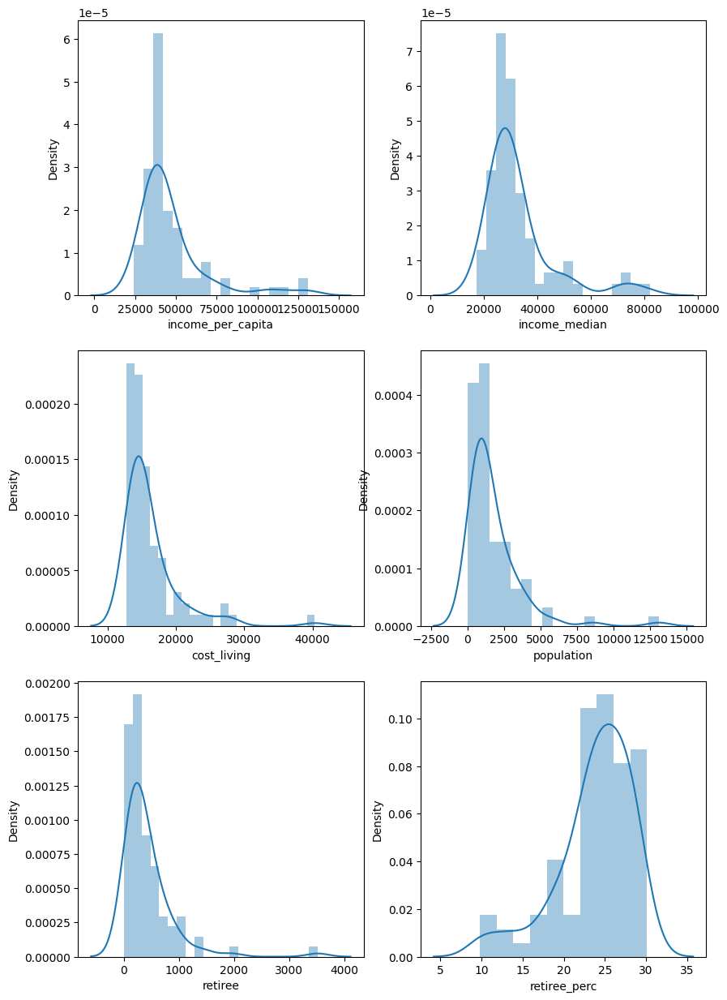

In [6]:
cols = [
    "income_per_capita",
    "income_median",
    "cost_living",
    "population",
    "retiree",
    "retiree_perc",
]

# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 15))

# Plot each column using seaborn distplot
for i, col in enumerate(cols):
    sns.distplot(gos_metrics[col], ax=axes[i // 2, i % 2])

# Show the plot
plt.show()

#### Price

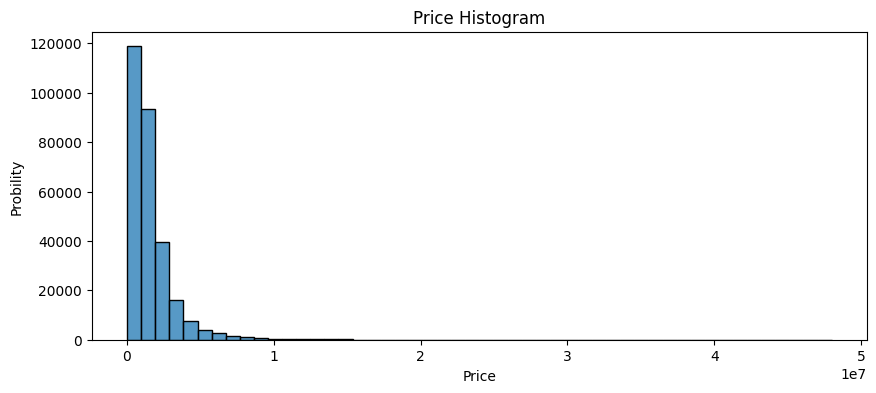

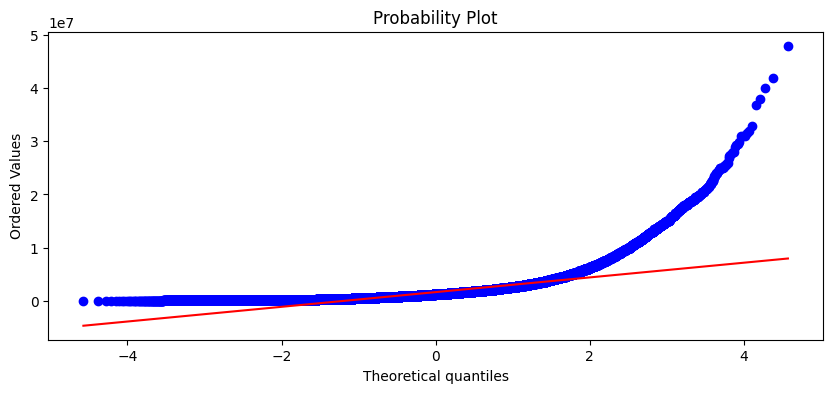

In [7]:
# target is highly asymmetric (skewed to the right)
fig = plt.figure(figsize=(10, 4))
g = sns.histplot(
    df_old, x=df_old["offers_price"].loc[df_old["offers_price"] > 0], bins=50
)
g.set_xlabel("Price")
g.set_ylabel("Probility")
g.set_title("Price Histogram")

fig = plt.figure(figsize=(10, 4))
res = stats.probplot(df_old["offers_price"].loc[df_old["offers_price"] > 0], plot=plt)

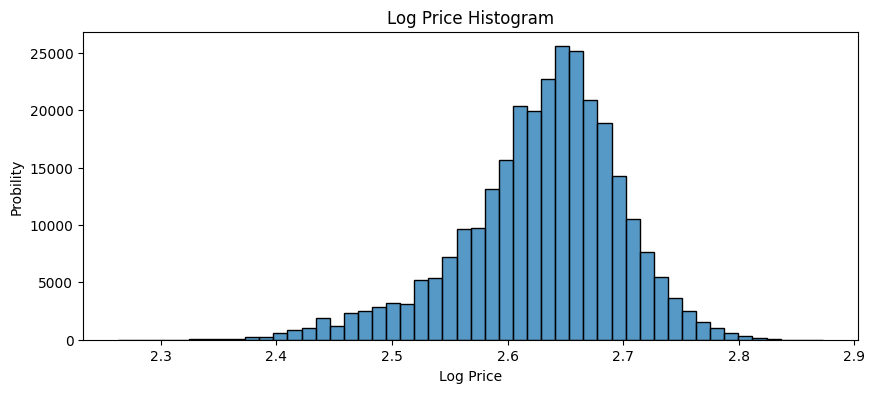

In [8]:
# graph for logged price
fig = plt.figure(figsize=(10, 4))
sns.histplot(
    df_old, x=np.log(df_old["log_price"].loc[df_old["log_price"] > 0]), bins=50
)
plt.xlabel("Log Price")
plt.ylabel("Probility")
plt.title("Log Price Histogram")
plt.show()

#### Mileage

Text(0.5, 1.0, 'Mileage Distribution')

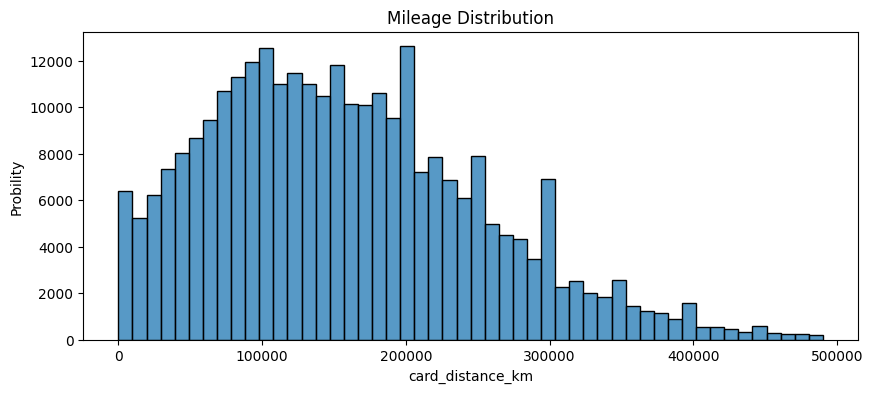

In [9]:
# custom price valuation
fig = plt.figure(figsize=(10, 4))
g = sns.histplot(
    df_old, x=df_old["card_distance_km"].loc[df_old["card_distance_km"] > 0], bins=50
)
g.set_xlabel("card_distance_km")
g.set_ylabel("Probility")
g.set_title("Mileage Distribution")

#### Engine

Text(0.5, 1.0, 'Engine Displacement Distribution')

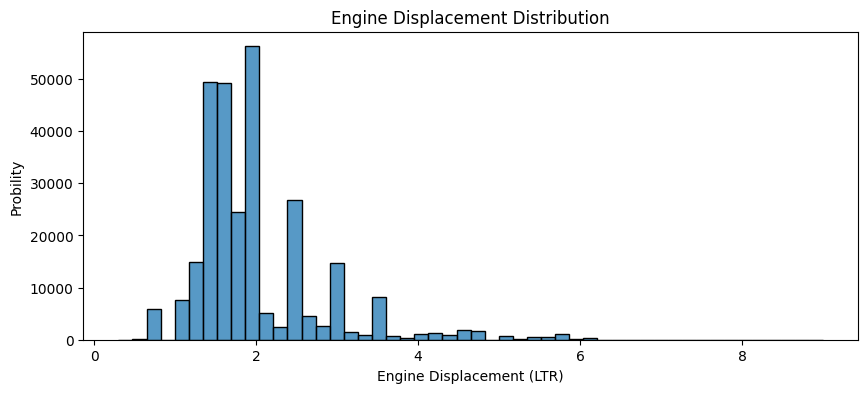

In [10]:
fig = plt.figure(figsize=(10, 4))
g = sns.histplot(
    df_old,
    x=df_old["vehicleEngine_engineDisplacement"].loc[
        df_old["vehicleEngine_engineDisplacement"] > 0
    ],
    bins=50,
)
g.set_xlabel("Engine Displacement (LTR)")
g.set_ylabel("Probility")
g.set_title("Engine Displacement Distribution")

Text(0.5, 1.0, 'Engine Power Distribution')

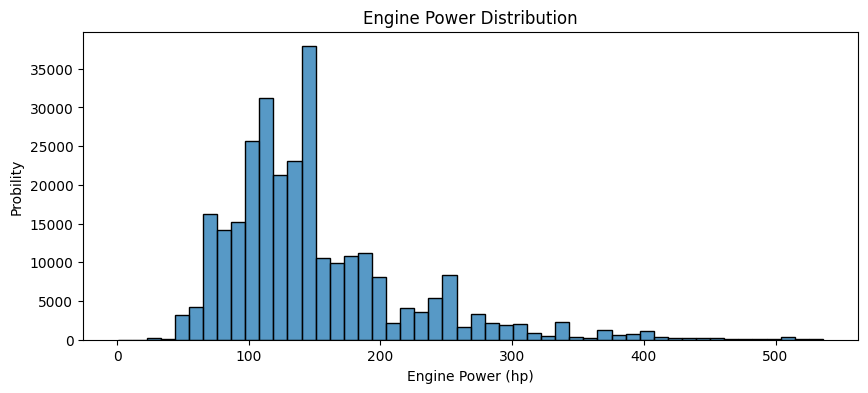

In [11]:
fig = plt.figure(figsize=(10, 4))
g = sns.histplot(
    df_old,
    x=df_old["vehicleEngine_enginePower"].loc[df_old["vehicleEngine_enginePower"] > 0],
    bins=50,
)
g.set_xlabel("Engine Power (hp)")
g.set_ylabel("Probility")
g.set_title("Engine Power Distribution")

<b><span style='color:#16C2D5'>|</span> Conclusion: </b>
<br>

* **`Gos metrics`** : Basically all metrics are skewed to right, retiree percent is only skeewed to left as it represents percentage of retired people that are outnumbered by working part. No need to process data, since its need for predictive analysis (transformer will solve the problem) and EDA on several maps. 


* **`Price`** : Skewed to the right. Normal behavior for price variable as less vehicles tend to be priced high.


* **`Mileage`** : Skewed to the right as well. Cars with a mileage multiple of 100k are sold more often. This may be due to sellers rounding up mileage or it may be a behavioral pattern. Drivers do not want to waste time and money on major repairs and maintenance, which occurs every 100k km of mileage.


* **`Engine`** : engine displacement and power are highly correlated (the more, the better rule). To be noticed,  distributions look alike. Eventually, we'll combine 2 coefficients or drop one (not great of a difference).


<br>
<div style="border-radius:10px;border:#16C2D5 solid;padding: 15px;background-color:#ffffff00;font-size:100%;text-align:left">
    💬 For sake of EDA, normalized target will be used. It depicts general dependancies and graphs would be much smoother. In prediction process scaler would be used, that is unified for all numeric columns of data frame. Age is considered categorical rather than numeric.
    
</div>

### Feature analysis

#### General

In [12]:
def generate_graphs(columns, dataframe, graphtype):
    """
    function to generate graphs
    """
    fig, axis = plt.subplots(2, 3, figsize=(12, 6))
    axis = axis.flatten()

    for i, col in enumerate(columns):
        if graphtype == "countplot":
            p = sns.countplot(
                data=dataframe,
                x=dataframe[col],
                ax=axis[i],
                palette="coolwarm",
                edgecolor="black",
            )
        elif graphtype == "boxplot":
            p = sns.boxplot(
                data=dataframe,
                x=dataframe[col],
                ax=axis[i],
                palette="coolwarm",
                edgecolor="black",
            )
        else:
            raise ValueError(
                "Invalid graphtype. Please choose 'countplot' or 'boxplot'."
            )

        axis[i].set_xticklabels(axis[i].get_xticklabels(), rotation=40)
        axis[i].set_title(col.capitalize(), fontsize=12, fontweight="bold")
        axis[i].set_xlabel("")
        axis[i].set_ylabel(
            "Count" if graphtype == "countplot" else "Value",
            fontsize=12,
            fontweight="bold",
        )

    # Remove any remaining empty subplots
    for j in range(len(columns), len(axis)):
        fig.delaxes(axis[j])

    plt.tight_layout()
    plt.show()

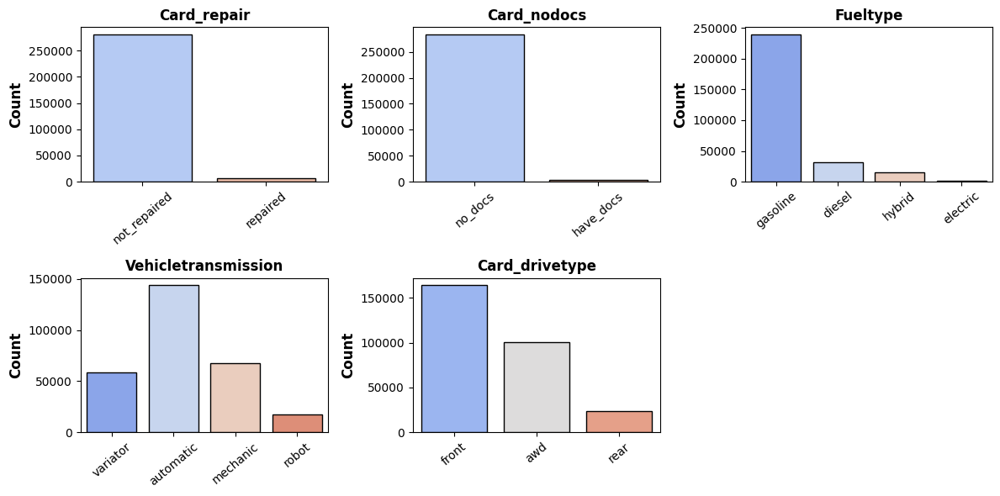

In [13]:
columns = [
    "card_repair",
    "card_noDocs",
    "fuelType",
    "vehicleTransmission",
    "card_driveType",
]

generate_graphs(columns=columns, dataframe=df_old, graphtype="countplot")

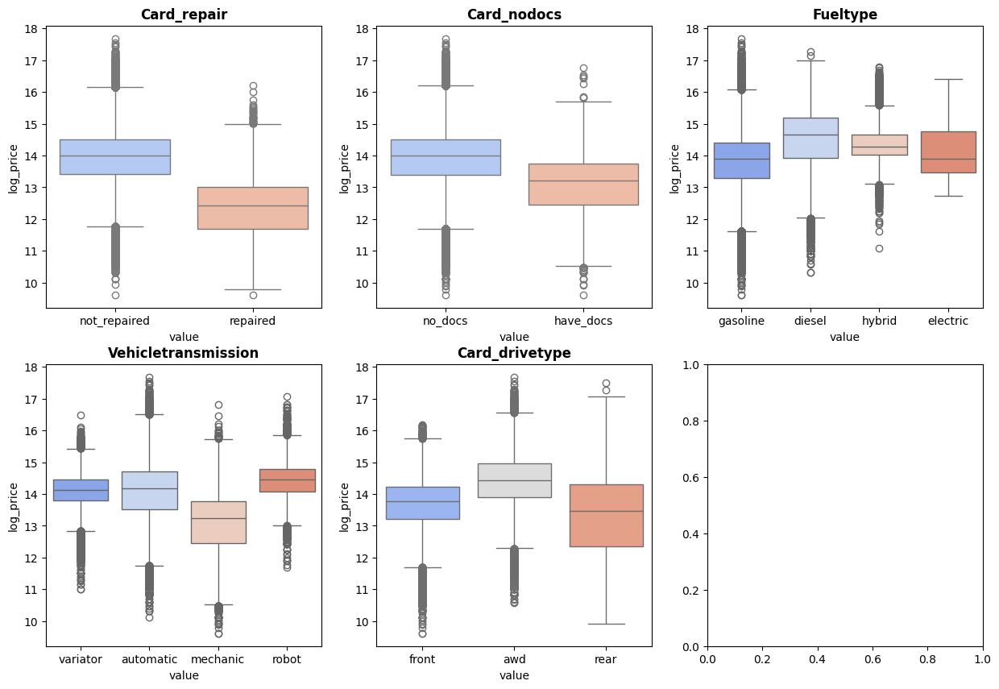

In [14]:
price_df = df_old[
    [
        "card_repair",
        "card_noDocs",
        "fuelType",
        "vehicleTransmission",
        "card_driveType",
        "log_price",
    ]
].melt(id_vars=["log_price"])

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

for num, val in enumerate(price_df.variable.unique()):
    sns.boxplot(
        data=price_df[price_df.variable == val],
        y="log_price",
        x="value",
        palette="coolwarm",
        ax=axes[num // 3, num % 3],
    )
    axes[num // 3, num % 3].set_title(val.capitalize(), fontsize=12, fontweight="bold")

plt.show()

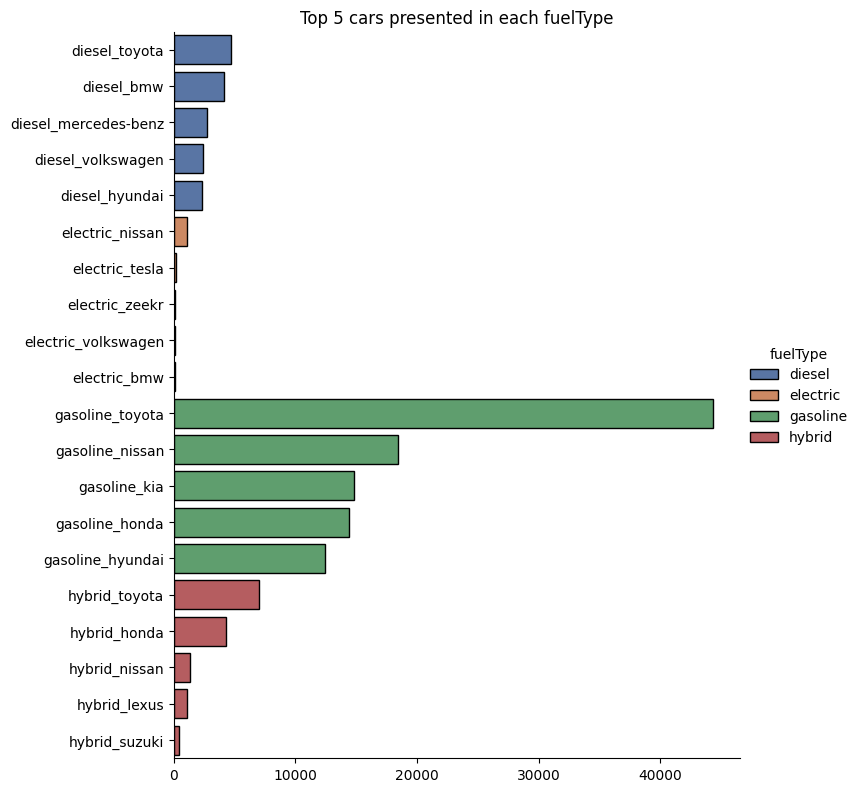

In [15]:
# top car brands in each fuel type category
counts = df_old[["fuelType", "brand"]].value_counts().reset_index(name="count")
top_fuelType = (
    counts.groupby("fuelType")
    .apply(lambda x: x.nlargest(5, "count"))
    .reset_index(drop=True)
)
top_fuelType["col1"] = top_fuelType["fuelType"] + "_" + top_fuelType["brand"]

# graph
sns.catplot(
    top_fuelType,
    y="col1",
    x="count",
    kind="bar",
    hue="fuelType",
    palette="deep",
    edgecolor="black",
    height=8,
)
plt.title("Top 5 cars presented in each fuelType")
plt.xlabel("")
plt.ylabel("")
plt.show()

<Figure size 1200x1000 with 0 Axes>

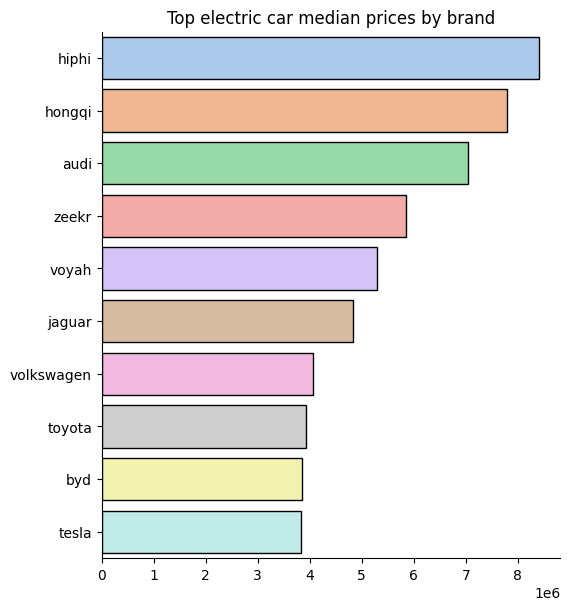

In [16]:
# electic top car prices
electric = (
    df_old.loc[df_old["fuelType"] == "electric"]
    .groupby(["brand"], as_index=False)["offers_price"]
    .median()
    .sort_values(by="offers_price", ascending=False)[:10]
)

# graph
plt.figure(figsize=(12, 10))
sns.catplot(
    electric,
    x="offers_price",
    y="brand",
    kind="bar",
    palette="pastel",
    edgecolor="black",
    height=6,
)
plt.title("Top electric car median prices by brand")
plt.xlabel("")
plt.ylabel("")
plt.show()

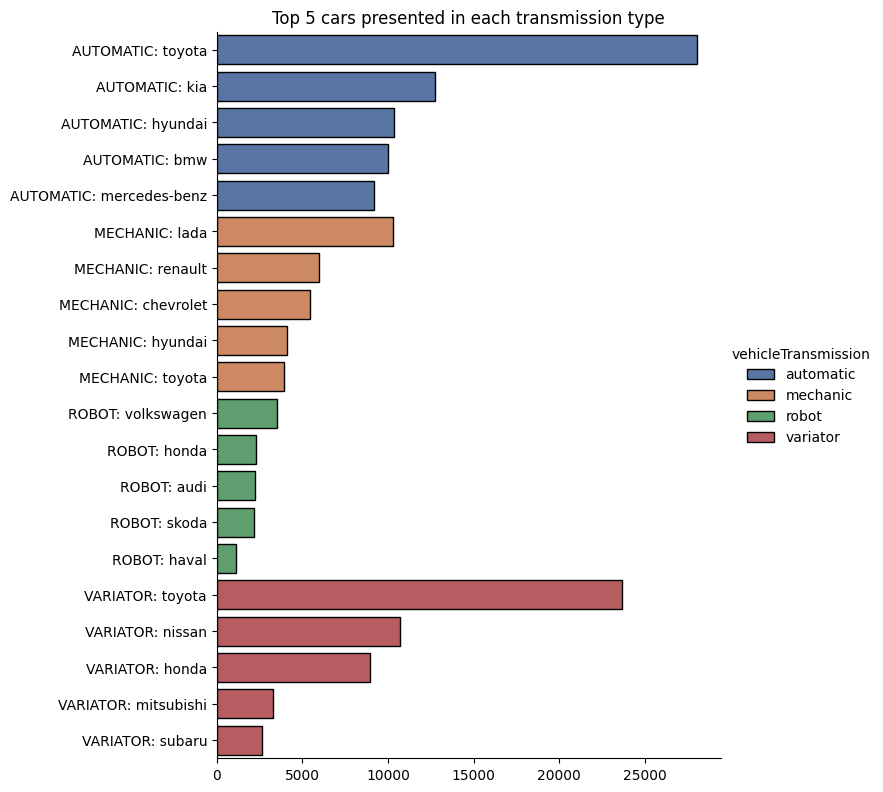

In [17]:
# top car models in each vehicleTransmission category
counts = (
    df_old[["vehicleTransmission", "brand"]].value_counts().reset_index(name="count")
)
top_fuelType = (
    counts.groupby("vehicleTransmission")
    .apply(lambda x: x.nlargest(5, "count"))
    .reset_index(drop=True)
)
top_fuelType["col1"] = (
    top_fuelType["vehicleTransmission"].str.upper() + ": " + top_fuelType["brand"]
)

# graph
sns.catplot(
    top_fuelType,
    y="col1",
    x="count",
    kind="bar",
    hue="vehicleTransmission",
    palette="deep",
    edgecolor="black",
    height=8,
)
plt.title("Top 5 cars presented in each transmission type")
plt.xlabel("")
plt.ylabel("")
plt.show()

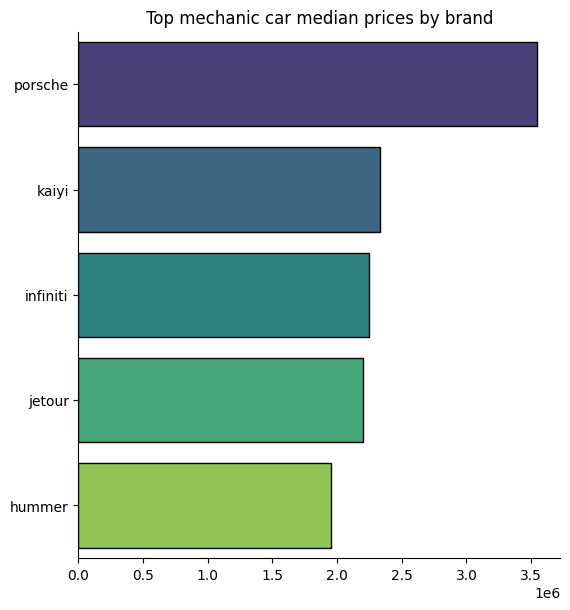

In [18]:
# mechanic top car prices
mechanic = (
    df_old.loc[df_old["vehicleTransmission"] == "mechaniс"]
    .groupby(["brand"], as_index=False)["offers_price"]
    .median()
    .sort_values(by="offers_price", ascending=False)[:5]
)

# graph
sns.catplot(
    mechanic,
    x="offers_price",
    y="brand",
    kind="bar",
    palette="viridis",
    edgecolor="black",
    height=6,
)
plt.title("Top mechanic car median prices by brand")
plt.xlabel("")
plt.ylabel("")
plt.show()

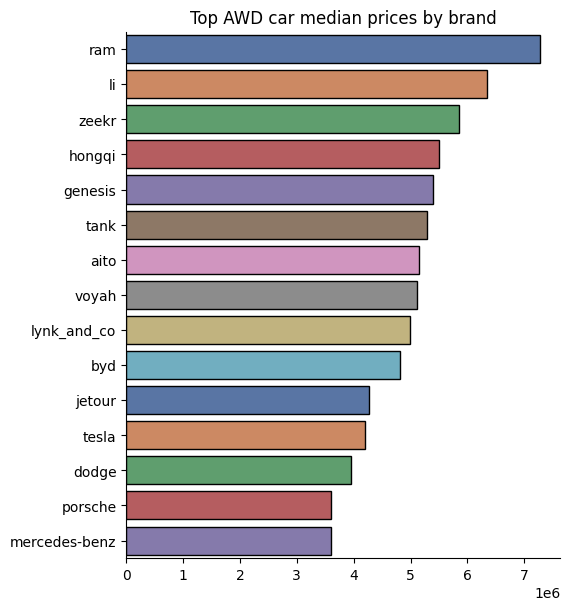

In [19]:
# AWD top car prices
awd = (
    df_old.loc[df_old["card_driveType"] == "awd"]
    .groupby(["brand"], as_index=False)["offers_price"]
    .median()
    .sort_values(by="offers_price", ascending=False)[:15]
)

# graph
sns.catplot(
    awd,
    x="offers_price",
    y="brand",
    kind="bar",
    palette="deep",
    edgecolor="black",
    height=6,
)
plt.title("Top AWD car median prices by brand")
plt.xlabel("")
plt.ylabel("")
plt.show()

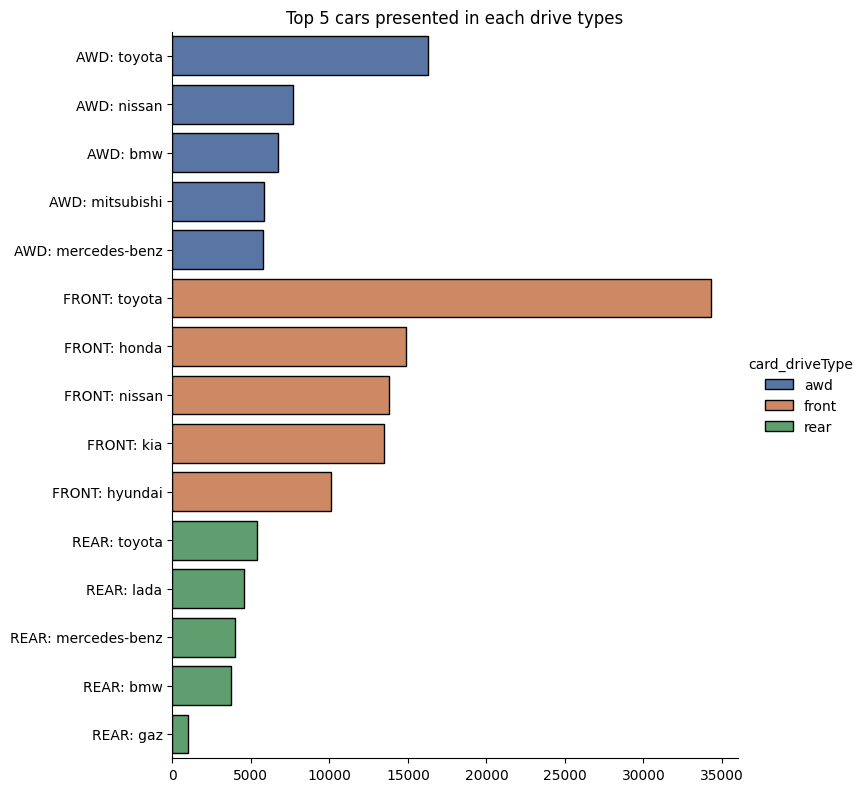

In [20]:
# top car models in each card_driveType category
counts = df_old[["card_driveType", "brand"]].value_counts().reset_index(name="count")
top_fuelType = (
    counts.groupby("card_driveType")
    .apply(lambda x: x.nlargest(5, "count"))
    .reset_index(drop=True)
)
top_fuelType["col1"] = (
    top_fuelType["card_driveType"].str.upper() + ": " + top_fuelType["brand"]
)

# graph
sns.catplot(
    top_fuelType,
    y="col1",
    x="count",
    kind="bar",
    hue="card_driveType",
    palette="deep",
    edgecolor="black",
    height=8,
)
plt.title("Top 5 cars presented in each drive types")
plt.xlabel("")
plt.ylabel("")
plt.show()

<b><span style='color:#16C2D5'>|</span> Conclusion: </b>
<br>

* **`Repaired`** and **`No documents`**: highly asymmetric categories. However, price is lower for off-catefory (cars that were reapired or needs repair - for obvious reason, and "cat in the box" vehicles without approved documents).


* **`Fuel type`** : main fuel type is gasoline. More than 70% are fueled with conservative type. Electric vehicles and diesel competing for highest priced type. Electric car is emerging market and models are overpriced on Russian markets. Also many of them produced in Asian countries (VAT and logistic cost are higher). Top priced electric cars are hiphi, hongqi and audi.


* **`Transmission`** : The manual transmission is presented in basic configurations of cars of a lower segment. Porsche panamera and 911 is above all by a wide margin (high end sport car).


* **`Drive type`** : all wheel drive is obviusly higher priced than alternatives as it costs more to construct and maintain. M-hero (above others by mile), RAM and li xian are highest valued on Russian market. Many electric cars are presented in list as they are above-average auto configuration and AWD is basic option.


<br>
<div style="border-radius:10px;border:#16C2D5 solid;padding: 15px;background-color:#ffffff00;font-size:100%;text-align:left">
    💬 All categories have noticable impact on vehicle price. However, we would not use first two: 'card_repair' and 'card_noDocs' as pricing policy is different for them.

</div>

#### Body, brands and models

In [21]:
def graph_top(
    data, feat_name, tar_name, graph_title=None, top_amount=None, palette="coolwarm"
):
    """
    generate two graphs based on column sorted by top values count
    """
    top_ = data[feat_name].value_counts().head(top_amount)

    # graph
    if len(top_.index.unique()) > 10:
        plt.figure(figsize=(13, 10))
    else:
        plt.figure(figsize=(5, 6))

    plt.subplot(2, 1, 1)
    g_0 = sns.countplot(
        x=feat_name, data=data, order=top_.index, palette=palette, edgecolor="black"
    )
    g_0.set_xlabel("")
    g_0.set_ylabel("Count")
    g_0.set_title(f"Amount by category of {graph_title}")
    g_0.set_xticklabels(g_0.get_xticklabels(), rotation=45)

    plt.subplot(2, 1, 2)
    g_1 = sns.boxplot(
        y=tar_name, x=feat_name, data=data, order=top_.index, palette=palette
    )
    g_1.set_title(f"Box plot for {graph_title}")
    g_1.set_ylabel("Price")
    g_1.set_xlabel("")
    g_1.set_xticklabels(g_1.get_xticklabels(), rotation=45)

    plt.subplots_adjust(hspace=0.4, top=1)

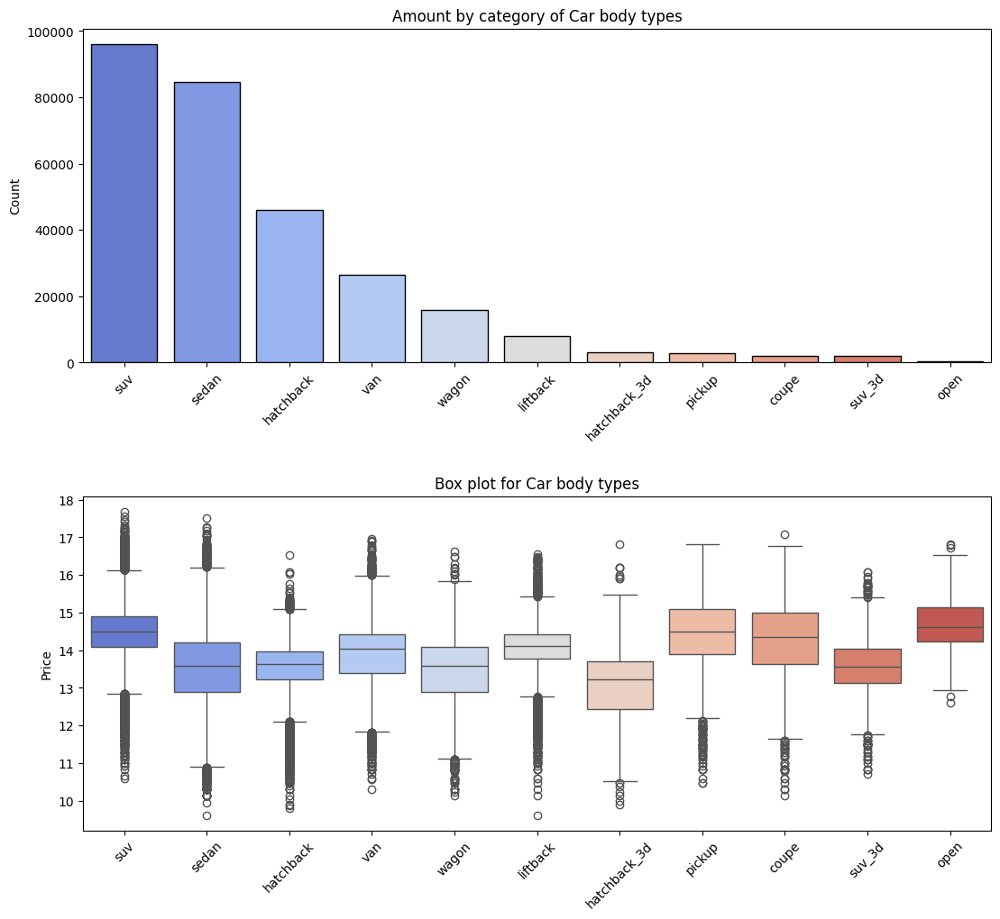

In [22]:
# Car body
graph_top(df_old, "bodyType", "log_price", graph_title="Car body types")

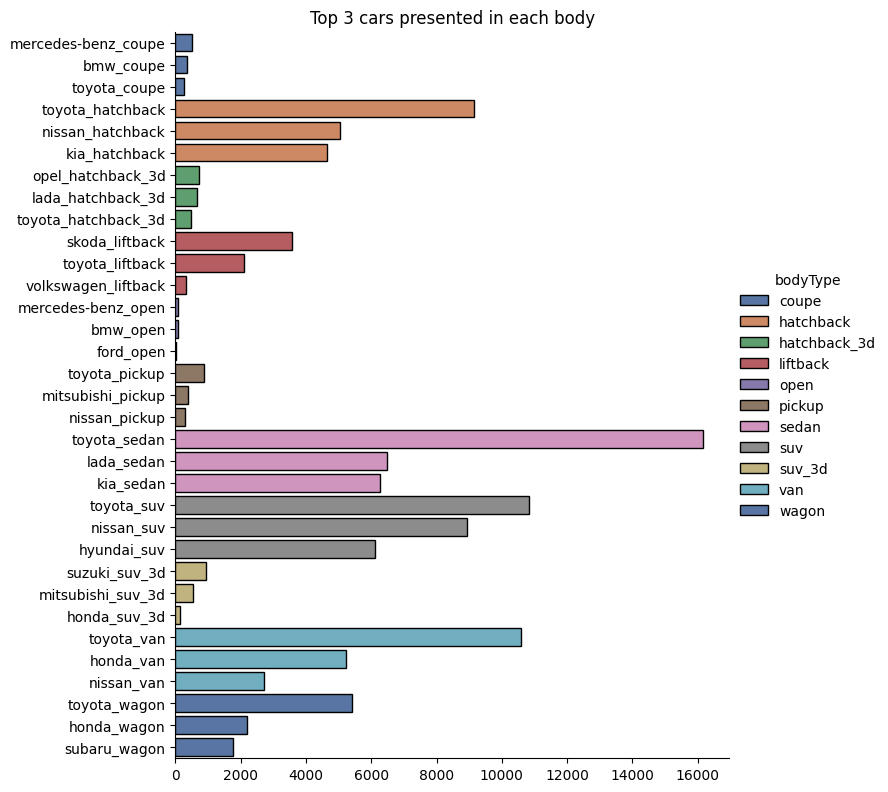

In [23]:
# top cars in each body type
counts = df_old.groupby("bodyType")["brand"].value_counts().reset_index(name="count")
top_brands = (
    counts.groupby("bodyType")
    .apply(lambda x: x.nlargest(3, "count"))
    .reset_index(drop=True)
)
top_brands["body_brand"] = top_brands["brand"] + "_" + top_brands["bodyType"]
top_brands

# graph
sns.catplot(
    top_brands,
    y="body_brand",
    x="count",
    kind="bar",
    hue="bodyType",
    palette="deep",
    edgecolor="black",
    height=8,
)
plt.title("Top 3 cars presented in each body")
plt.xlabel("")
plt.ylabel("")
plt.show()

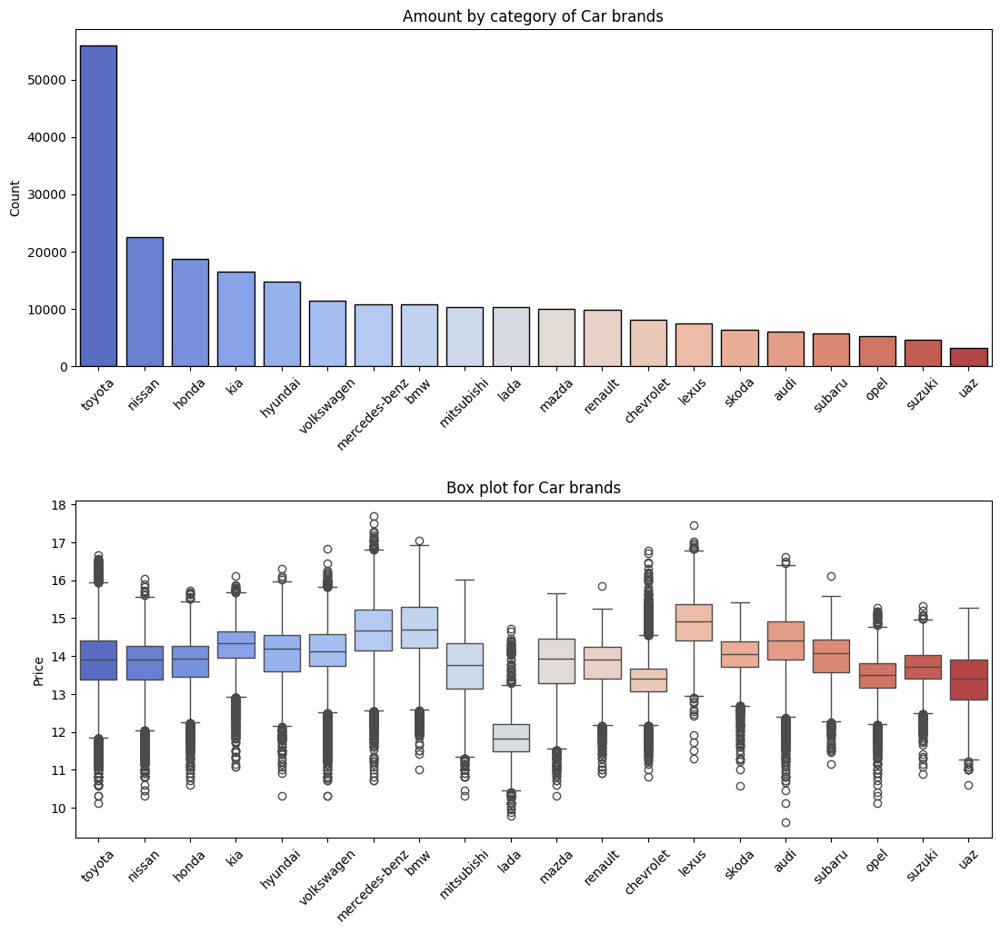

In [24]:
# Box plot for top car brands
graph_top(df_old, "brand", "log_price", graph_title="Car brands", top_amount=20)

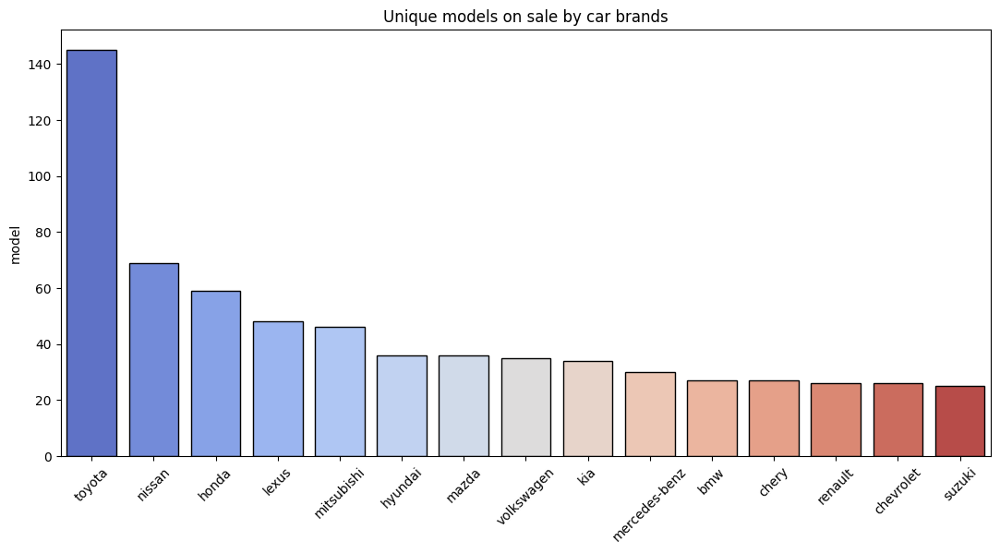

In [25]:
# Car brands with the widest model range
unique_models = (
    df_old.groupby("brand")["model"]
    .nunique()
    .sort_values(ascending=False)
    .reset_index()
    .head(15)
)

# graph
plt.figure(figsize=(13, 6))
sns.barplot(
    data=unique_models, x="brand", y="model", edgecolor="black", palette="coolwarm"
)
plt.title("Unique models on sale by car brands")
plt.xlabel("")
plt.xticks(rotation=45)
plt.show()

<b><span style='color:#16C2D5'>|</span> Conclusion: </b>
<br>

* **`Body`**: Most popular body on Russian market is SUV, which is due to harsh climate on majority of country. They are relatively more priced as they have majority AWD (70% and more). Sendan has variety of models that is relatively cheap models, which is depicted on lower box-plot. 


* **`Brand`** : Cars from asian manufacturers has higher stake in total vehicles presented on market with Toyota dominating absolutely in every category. To be noticed, skoda has leadership in liftback type, suv_3d do not have toyota presented. Russian vehicles are outnumbered and priced lower that others in top 20 (only 10th place by total amount). In the top 20, the premium segment includes mercedez-benz, BMW, lexus, audi.


* **`Models`** : The limitation of the analysis is that a maximum of 2,000 unique car_ids could be obtained during parsing (100 pages). We assume that different model priced differently. Further analysis and modernization of data acquisition process can reveal much more insight into used car market.

#### Color

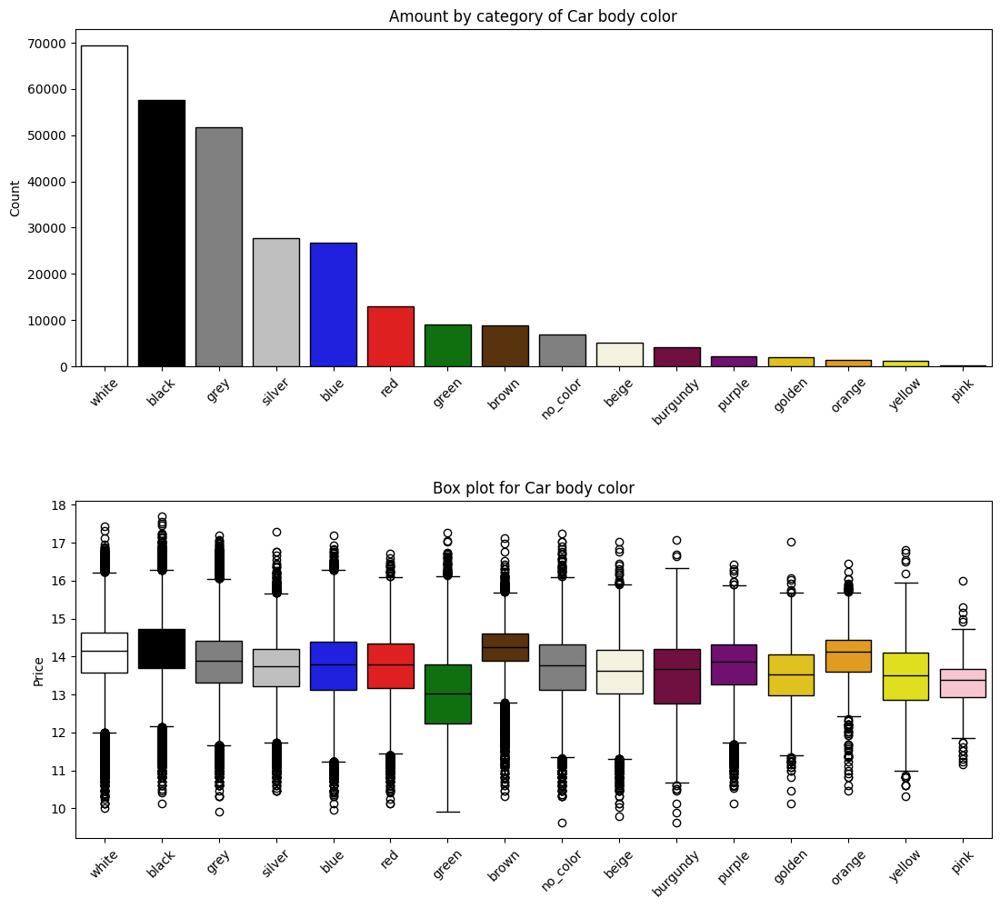

In [26]:
# Car color
# assign colors for each bar
color_palette = {
    "black": (0, 0, 0, 1),
    "white": (1, 1, 1, 1),
    "silver": (0.75, 0.75, 0.75, 1),
    "grey": (0.5, 0.5, 0.5, 1),
    "brown": (0.4, 0.2, 0, 1),
    "blue": (0, 0, 1, 1),
    "green": (0, 0.5, 0, 1),
    "beige": (0.96, 0.96, 0.86, 1),
    "burgundy": (0.5, 0, 0.25, 1),
    "no_color": (0.5, 0.5, 0.5, 1),
    "red": (1, 0, 0, 1),
    "golden": (1, 0.84, 0, 1),
    "yellow": (1, 1, 0, 1),
    "purple": (0.5, 0, 0.5, 1),
    "orange": (1, 0.65, 0, 1),
    "pink": (1, 0.75, 0.8, 1),
}

# Create a list of colors based on the car colors in the dataset
colors = [color_palette[color] for color in df_old["color"].value_counts().index]

graph_top(df_old, "color", "log_price", graph_title="Car body color", palette=colors)

In [27]:
df_old.loc[df_old.color == "black"].groupby(["bodyType", "brand", "model"])[
    "log_price"
].agg(["count", "median"]).reset_index().sort_values(by="count", ascending=False)[
    :10
].reset_index(
    drop=True
)

,bodyType,brand,model,count,median
0,sedan,mercedes-benz,s-class,718,14.51
1,sedan,mercedes-benz,e-class,694,14.65
2,suv,bmw,x5,692,14.62
3,sedan,bmw,5-series,679,14.58
4,suv,toyota,harrier,625,14.90
5,sedan,toyota,camry,595,14.56
6,suv,toyota,land_cruiser,589,15.24
7,suv,toyota,land_cruiser_prado,573,15.07
8,suv,volkswagen,touareg,558,14.56
9,sedan,nissan,teana,536,14.04


In [28]:
df_old.loc[df_old.color == "green"].groupby(["bodyType", "brand"])["log_price"].agg(
    ["count", "median"]
).reset_index().sort_values(by="count", ascending=False)[:10].reset_index(drop=True)

,bodyType,brand,count,median
0,sedan,lada,1127,11.81
1,sedan,toyota,634,12.77
2,suv,uaz,494,13.12
3,hatchback,lada,351,11.92
4,hatchback,toyota,296,13.77
5,suv,toyota,252,14.26
6,suv,chevrolet,209,13.30
7,suv,nissan,198,14.38
8,van,toyota,182,13.27
9,wagon,lada,169,11.85


In [29]:
df_old.loc[df_old.color == "brown"].groupby(["bodyType", "brand"])["log_price"].agg(
    ["count", "median"]
).reset_index().sort_values(by="count", ascending=False)[:10].reset_index(drop=True)

,bodyType,brand,count,median
0,suv,renault,437,14.21
1,suv,hyundai,370,14.40
2,suv,nissan,313,14.11
3,suv,kia,281,14.56
4,hatchback,kia,275,14.19
5,suv,volkswagen,271,14.76
6,sedan,volkswagen,269,14.02
7,suv,toyota,264,14.78
8,suv,bmw,225,14.61
9,van,toyota,217,14.14


In [30]:
df_old.loc[df_old.color == "orange"].groupby(["bodyType", "brand"])["log_price"].agg(
    ["count", "median"]
).reset_index().sort_values(by="median", ascending=False)[:10].reset_index(drop=True)

,bodyType,brand,count,median
0,suv,porsche,5,16.04
1,wagon,zeekr,12,15.70
2,sedan,dodge,1,15.42
3,open,audi,1,15.42
4,coupe,chevrolet,1,15.34
5,pickup,isuzu,3,15.32
6,coupe,dodge,4,15.31
7,pickup,toyota,7,15.29
8,coupe,ford,4,15.25
9,suv,jeep,10,15.24


<b><span style='color:#16C2D5'>|</span> Conclusion: </b>
<br>

* **`Color`**: Subjected feature in scope of the causal relationship. 


* **`Black`**: From a marketing point of view, black is considered a premium color. Box-plot reveals that black cars are priced higher. Mercedez-benz, BMW, Land-Cruizer, Prado. 


* **`Green`**: The pricing of green and brown cars is out of the general pattern and proves logic: green is stock (basic) color for lower valued vehicles (lada, chevrolet, uaz - near 13, some below 12 logged price).


* **`Brown`**: On contrary, brown cars are suv's (top median logged prices are above 14).


* **`Orange`**: Orange is basically sports-car color (lambo, porche, mcLaren). It is perceived to be premium class (median is compared to black vehicles).

#### Production date

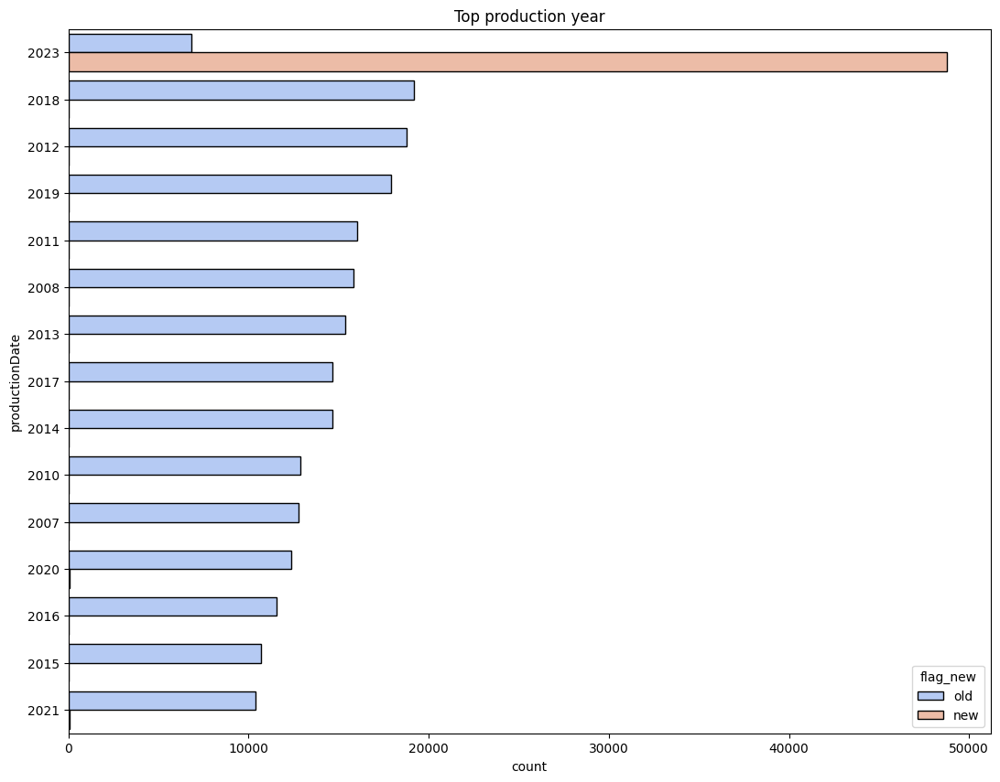

In [31]:
plt.figure(figsize=(13, 10))
sns.countplot(
    y="productionDate",
    data=ru_df,
    palette="coolwarm",
    order=ru_df["productionDate"].value_counts().index[0:15],
    edgecolor="black",
    hue="flag_new",
)
plt.title("Top production year")
plt.show()

#### Geo data

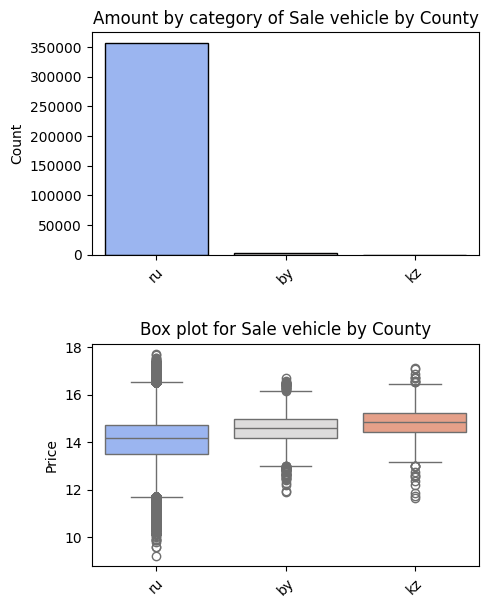

In [32]:
# country_code (for general data)
graph_top(df, "country_code", "log_price", graph_title="Sale vehicle by County")

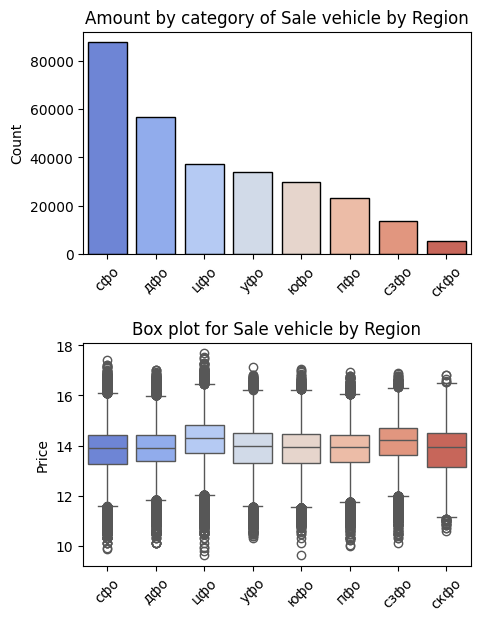

In [33]:
# region_nom
graph_top(df_old, "region_nom", "log_price", graph_title="Sale vehicle by Region")

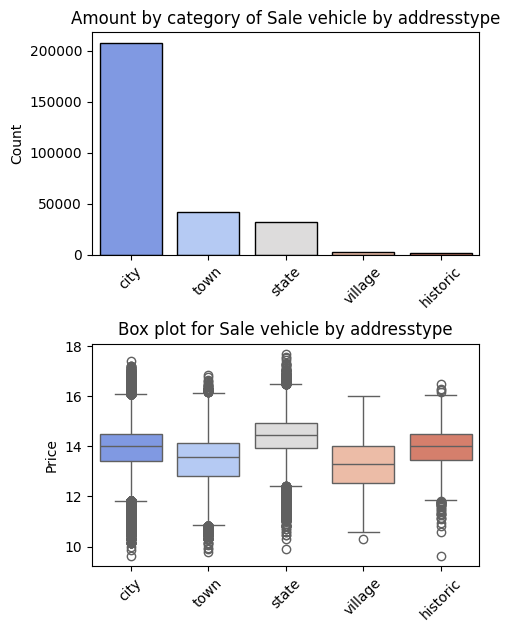

In [34]:
# addresstype
graph_top(
    df_old,
    "addresstype",
    "log_price",
    graph_title="Sale vehicle by addresstype",
    top_amount=5,
)

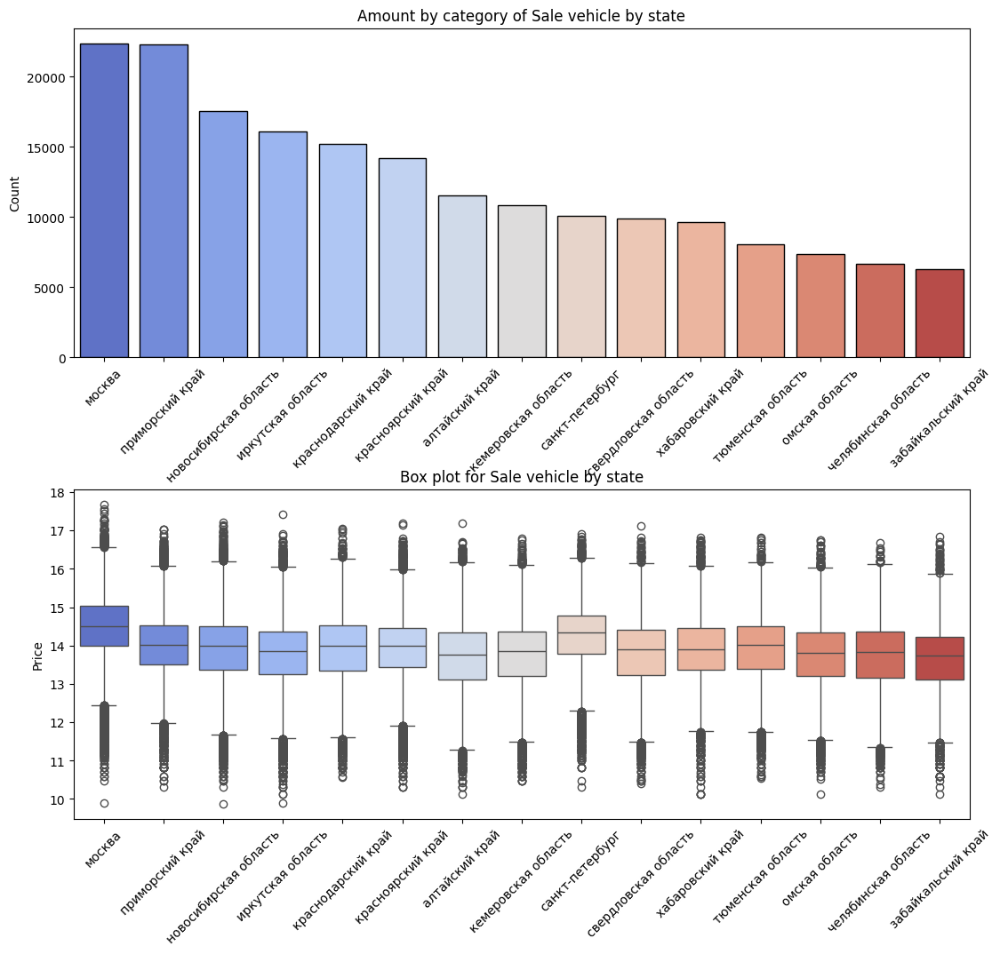

In [35]:
# state
graph_top(
    df_old, "state", "log_price", graph_title="Sale vehicle by state", top_amount=15
)

In [36]:
def data_proc_map(data, target, round_num_tar=0, method="median"):
    """
    Prepare grouped data frame for plot_map function
    """
    if method == "count":
        grouped_df = data.groupby(["state", "name", "lat", "lon"], as_index=False)[
            target
        ].count()
    elif method == "mean":
        grouped_df = data.groupby(["state", "name", "lat", "lon"], as_index=False)[
            target
        ].mean()
    elif method == "sum":
        grouped_df = data.groupby(["state", "name", "lat", "lon"], as_index=False)[
            target
        ].sum()
    else:
        grouped_df = data.groupby(["state", "name", "lat", "lon"], as_index=False)[
            target
        ].median()

    grouped_df[["lat", "lon"]] = grouped_df[["lat", "lon"]].apply(lambda x: x.round(2))
    grouped_df[[target]] = grouped_df[[target]].apply(lambda x: x.round(round_num_tar))
    grouped_df["state_name"] = grouped_df["state"] + "_" + grouped_df["name"]
    grouped_df.loc[grouped_df["state"] == "no_info", "state_name"] = grouped_df.loc[
        grouped_df["state"] == "no_info", "name"
    ]
    return grouped_df


# def data_proc_map(data, target, round_num_tar=0, method='median', n_clusters=100):
#     '''
#     Prepare grouped data frame for plot_map function
#     '''
#     from sklearn.cluster import KMeans

#     if method == 'count':
#         grouped_df = data.groupby(['state', 'name', 'lat', 'lon'], as_index=False)[target].count()
#     elif method == 'mean':
#         grouped_df = data.groupby(['state', 'name', 'lat', 'lon'], as_index=False)[target].mean()
#     elif method == 'sum':
#         grouped_df = data.groupby(['state', 'name', 'lat', 'lon'], as_index=False)[target].sum()
#     else:
#         grouped_df = data.groupby(['state', 'name', 'lat', 'lon'], as_index=False)[target].median()

#     grouped_df[['lat', 'lon']] = grouped_df[['lat', 'lon']].apply(lambda x: x.round(2))
#     grouped_df[[target]] = grouped_df[[target]].apply(lambda x: x.round(round_num_tar))
#     grouped_df['state_name'] = grouped_df['state'] + '_' + grouped_df['name']
#     grouped_df.loc[grouped_df['state'] == 'no_info',
#                    'state_name'] = grouped_df.loc[grouped_df['state'] == 'no_info', 'name']

#     # Perform KMeans clustering on the latitude and longitude columns
#     kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init='auto').fit(grouped_df[['lon', 'lat']])

#     # Add a new column to the DataFrame to store the cluster assignments
#     grouped_df['cluster'] = kmeans.labels_

#     # Create new columns for the latitude and longitude of the cluster centers
#     lat_cluster = kmeans.cluster_centers_[:, 0]
#     lon_cluster = kmeans.cluster_centers_[:, 1]
#     grouped_df['lat_cluster'] = lat_cluster[grouped_df['cluster']]
#     grouped_df['lon_cluster'] = lon_cluster[grouped_df['cluster']]

#     grouped_df_cluster = grouped_df.groupby(['cluster', 'lat_cluster', 'lon_cluster']
#                                             , as_index=False)[target].median()

#     return grouped_df_cluster


def plot_map(
    data,
    target,
    hover_name_=None,
    mapbox_style_num=0,
    scale_num=0,
    px_style="scatter_mapbox",
):
    """
    bubble-map guide: https://python-charts.com/spatial/bubble-map-plotly/
    scattermapbox guide: https://plotly.com/python/scattermapbox/
    colors: https://plotly.com/python/builtin-colorscales/
    example: https://stackoverflow.com/questions/66044950/how-to-correctly-display-plotly-density-mapbox
    """
    # styles
    mapbox_style_ = [
        "open-street-map",
        "white-bg",
        "carto-positron",
        "carto-darkmatter",
        "dark",
    ]
    color_continuous_scale_ = ["jet", "Viridis", "Rainbow"]
    custom_scale = [
        [0.0, "green"],
        [0.4, "green"],
        [0.40000001, "yellow"],
        [0.76, "yellow"],
        [0.76000001, "red"],
        [1, "red"],
    ]

    # plot graph
    if px_style == "scatter_mapbox":
        fig = px.scatter_mapbox(
            data,
            lat="lat",
            lon="lon",
            color=target,
            # size='log_price',
            # size_max=20,
            # marker=px.Marker(
            # size=8,
            # color=data['cluster'],  # Use the cluster labels as the color
            # opacity=0.8),
            mapbox_style=mapbox_style_[mapbox_style_num],
            color_continuous_scale=color_continuous_scale_[scale_num],
            # color_continuous_scale=custom_scale,
            # opacity=0.8,
            center=dict(lat=60, lon=100),
            zoom=1.9,
            # labels={'log_price': 'Vehicle price'},
            hover_name=hover_name_,
        )
        fig.update_layout(margin=dict(b=0, t=0, l=0, r=0))
        # fig.update_traces(cluster=dict(enabled=True))  # create cluster, but doesn't work for some reason
        fig.show()

    elif px_style == "density_mapbox":
        fig = px.density_mapbox(
            data,
            lat="lat",
            lon="lon",
            z=target,
            radius=4,
            mapbox_style=mapbox_style_[mapbox_style_num],
            color_continuous_scale="rainbow",
            opacity=0.8,
            center=dict(lat=60, lon=100),
            zoom=1.9,
            hover_name=hover_name_,
        )
        fig.update_layout(margin=dict(b=0, t=0, l=0, r=0))
        fig.show()

In [37]:
# # Vehicle prices for old cars between regions
# plot_map(data_proc_map(df_old, target='log_price', round_num_tar=2, method='mean'),
#          target='log_price',
#          hover_name_='state_name',
#          px_style='density_mapbox')

In [38]:
# Vehicle prices for old cars between regions
plot_map(
    data_proc_map(df_old, target="log_price", round_num_tar=2),
    target="log_price",
    hover_name_="state_name",
)

In [39]:
# Vehicle prices on coupe cars between regions
plot_map(
    data_proc_map(
        df.loc[df["bodyType"] == "open"], target="log_price", round_num_tar=2
    ),
    target="log_price",
    hover_name_="state_name",
    mapbox_style_num=3,
)

In [40]:
# Vehicle production date between regions
plot_map(
    data_proc_map(df_old, target="productionDate", round_num_tar=0),
    target="productionDate",
    hover_name_="state_name",
)

In [41]:
# Vehicle mileage between regions
plot_map(
    data_proc_map(df_old, target="card_distance_km", round_num_tar=0),
    target="card_distance_km",
    hover_name_="state_name",
)

In [42]:
# gos_metrics
# income_per_capita between regions
plot_map(
    data_proc_map(df_old, target="income_per_capita", round_num_tar=0),
    target="income_per_capita",
    hover_name_="state_name",
)

In [43]:
# income_median between regions
plot_map(
    data_proc_map(df_old, target="income_median", round_num_tar=0),
    target="income_median",
    hover_name_="state_name",
)

In [44]:
# cost_living between regions
plot_map(
    data_proc_map(df_old, target="cost_living", round_num_tar=0),
    target="cost_living",
    hover_name_="state_name",
)

In [45]:
# population between regions
plot_map(
    data_proc_map(df_old, target="population", round_num_tar=0),
    target="population",
    hover_name_="state_name",
)

In [46]:
# retiree between regions
plot_map(
    data_proc_map(df_old, target="retiree", round_num_tar=0),
    target="retiree",
    hover_name_="state_name",
)

In [47]:
# population between regions
plot_map(
    data_proc_map(df_old, target="retiree_perc", round_num_tar=0),
    target="retiree_perc",
    hover_name_="state_name",
)

In [48]:
# cluster analysis of prices by region
grouped = df_old.groupby(["state"])["lat", "lon", "offers_price"].median().reset_index()
grouped["offers_price"] = (grouped["offers_price"] / 1000000).round(2)
grouped[["lat", "lon"]] = grouped[["lat", "lon"]].round(2)

# Vehicle prices for old cars between regions
plot_map(grouped, target="offers_price", hover_name_="state", mapbox_style_num=0)

In [49]:
# cluster analysis of mileage by region
grouped = (
    df_old.groupby(["state"])["lat", "lon", "income_median"].median().reset_index()
)
grouped["income_median"] = (grouped["income_median"] / 1000).round(2)
grouped[["lat", "lon"]] = grouped[["lat", "lon"]].round(2)
grouped = grouped.loc[grouped.income_median > 0]

# Vehicle mileage between regions
plot_map(grouped, target="income_median", hover_name_="state", mapbox_style_num=0)

<b><span style='color:#16C2D5'>|</span> Conclusion: </b>
<br>

* **`Country`**: Majority of vehicles are from Russia. Median price in KZ and BY is highers due to Vat.


* **`Fedetal district`**: Most popular is "СФО" as district are is the greater then others. Drom is mostly concentrated in middle and south of Russia. Obviously cars are priced more in "ЦФО" as median salary is higher.


* **`Geo`**: More expensive and newer cars are concentrated in the Central Federal District. The further north/east, the higher the median price/productionDate. In the central part of Russia, the median year of the car is 2000-2005 and, accordingly, the service life is higher. On the northern border and the northeast, vehicles are practically not available for sale, with the exception of large centers such as Anadyr, Norilsk, Olenek, Udachnik.


* **`Gos Metrics`**: Metrics obtained from the rosstat website are pre-divided by region and do not have geolocation. It is necessary to leave only 2 metrics from the category of finance and national composition. They will probably be correlated, both with each other and with other features of the data frame..


<br>
<div style="border-radius:10px;border:#16C2D5 solid;padding: 15px;background-color:#ffffff00;font-size:100%;text-align:left">
    💬 In the future, it is proposed to use clusters to analyze median indicators by region. In the current version of EDA, maps are overloaded, especially in the central and southern Federal Districts. Simplified version of cluster analysis is presented on last map, but it is not interractive enough.

</div>

### Other findings

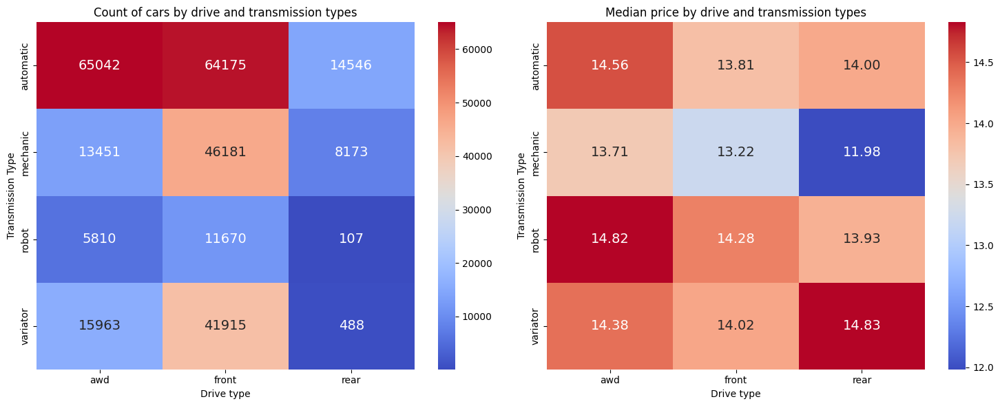

In [50]:
# log_price
# Pivot table_metric
pivot_table_metric = df_old.pivot_table(
    values="log_price",
    index="vehicleTransmission",
    columns="card_driveType",
    aggfunc="median",
)

# Pivot table_count
pivot_table_count = df_old.pivot_table(
    values="log_price",
    index="vehicleTransmission",
    columns="card_driveType",
    aggfunc="count",
)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot heatmap for count of cars
sns.heatmap(
    pivot_table_count,
    annot=True,
    fmt=".0f",
    cmap="coolwarm",
    ax=axes[0],
    annot_kws={"size": 14},
)
axes[0].set_title("Count of cars by drive and transmission types")
axes[0].set_xlabel("Drive type")
axes[0].set_ylabel("Transmission Type")

# Plot heatmap for price metric
sns.heatmap(
    pivot_table_metric,
    annot=True,
    fmt=",.2f",
    cmap="coolwarm",
    ax=axes[1],
    annot_kws={"size": 14},
)
axes[1].set_title("Median price by drive and transmission types")
axes[1].set_xlabel("Drive type")
axes[1].set_ylabel("Transmission Type")

# Adjust spacing between subplots
plt.tight_layout()

# Show the combined figure
plt.show()

In [51]:
def plot_pivots(data, target_lst, rows, cols, agg_func="mean", round_=1):
    if agg_func == "count":
        fig = plt.figure(figsize=(6, 4))
        # Plot heatmap for count of cars
        sns.heatmap(
            data.pivot_table(
                values=target_lst[0], index=rows, columns=cols, aggfunc=agg_func
            ),
            annot=True,
            fmt=".0f",
            cmap="coolwarm",
            annot_kws=dict(size=8),
        )
        plt.title(f"Heatmap for count in each category:\n{rows} vs {cols}")
        plt.xlabel("")
        plt.ylabel("")

    else:

        # Calculate the number of rows and columns for the subplots based on the length of target_lst
        num_rows = (len(target_lst) - 1) // 2 + 1
        num_cols = min(len(target_lst), 2)

        # Create subplots
        fig, axes = plt.subplots(
            num_rows, num_cols, figsize=(10, 15 * (num_cols // num_rows + 1))
        )

        for i, tar in enumerate(target_lst):
            # Calculate the subplot index based on the current iteration
            subplot_row = i // num_cols
            subplot_col = i % num_cols
            axes = axes.reshape(num_rows, num_cols)

            if data[tar].median() < 1000:
                # Plot heatmap for count of cars
                sns.heatmap(
                    data.pivot_table(
                        values=tar, index=rows, columns=cols, aggfunc=agg_func
                    ),
                    annot=True,
                    fmt=".0f",
                    cmap="coolwarm",
                    ax=axes[subplot_row, subplot_col],
                    annot_kws=dict(size=7),
                )
                axes[subplot_row, subplot_col].set_title(
                    f"Heatmap for {agg_func} {tar}"
                )
                axes[subplot_row, subplot_col].set_xlabel("")
                axes[subplot_row, subplot_col].set_xlabel("")

            else:
                # Plot heatmap for count of cars
                sns.heatmap(
                    data.pivot_table(
                        values=tar,
                        index=rows,
                        columns=cols,
                        # aggfunc=agg_func).apply(lambda x: np.log1p(x)),
                        aggfunc=agg_func,
                    )
                    / 1000,
                    annot=True,
                    fmt=f".{round_}f",
                    cmap="coolwarm",
                    ax=axes[subplot_row, subplot_col],
                    annot_kws=dict(size=7),
                )
                axes[subplot_row, subplot_col].set_title(
                    f"Heatmap for {agg_func} {tar} (*1000)"
                )
                axes[subplot_row, subplot_col].set_xlabel("")
                axes[subplot_row, subplot_col].set_xlabel("")

        # Adjust spacing between subplots
        plt.tight_layout()
    plt.show()

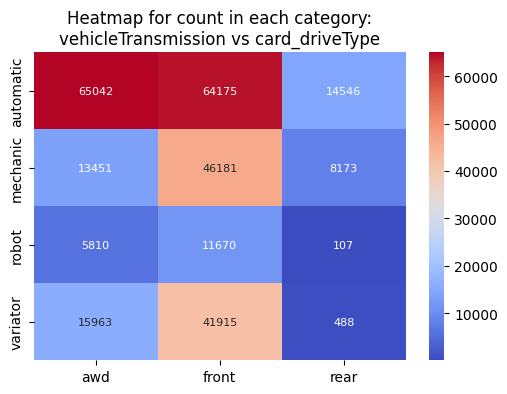

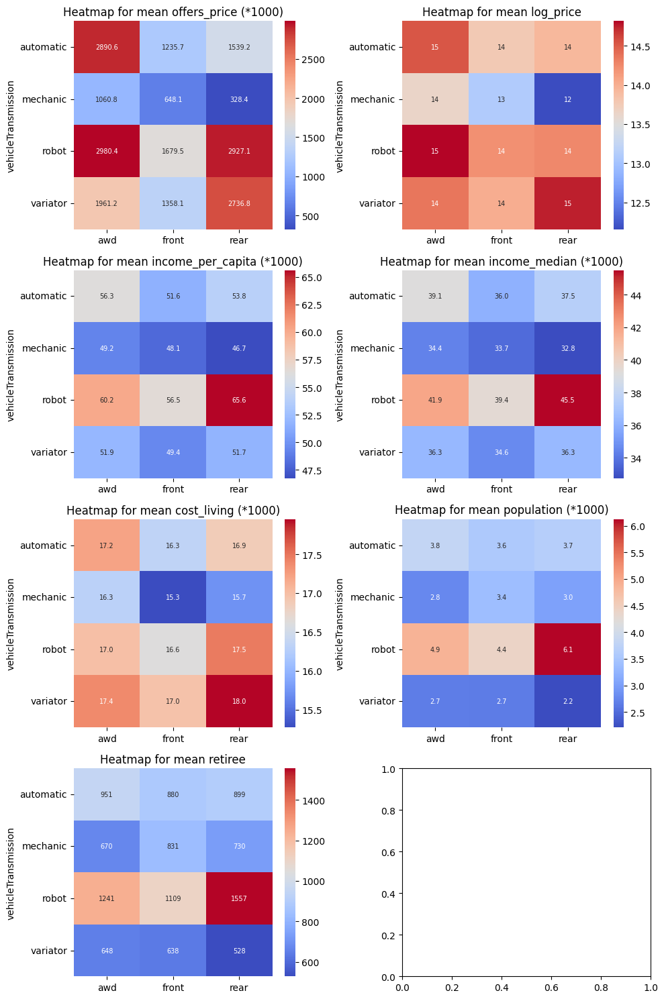

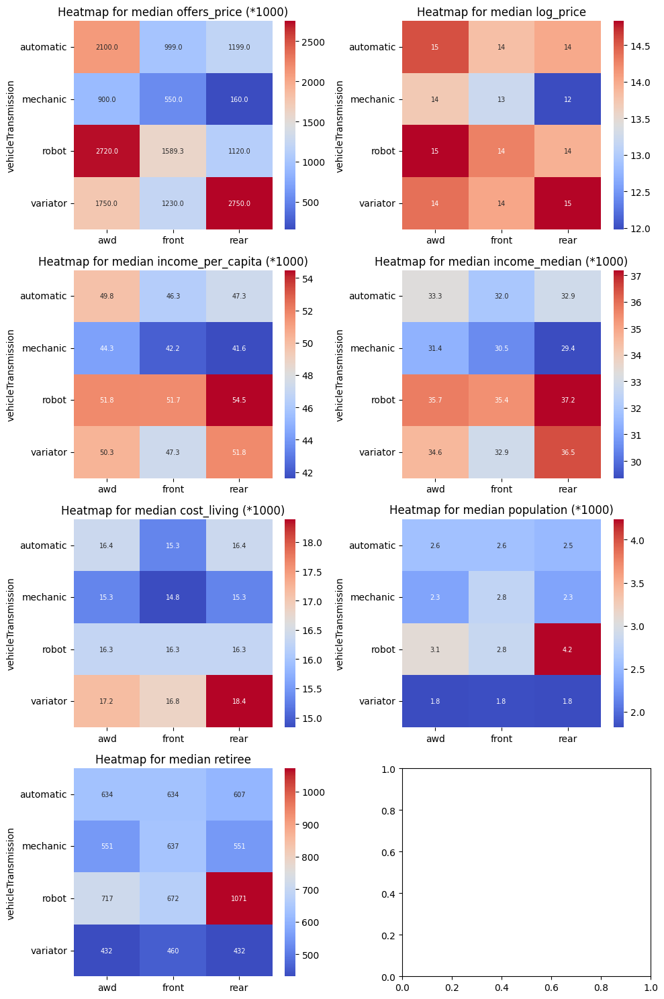

In [52]:
tars = [
    "offers_price",
    "log_price",
    "income_per_capita",
    "income_median",
    "cost_living",
    "population",
    "retiree",
]

metrics_ = ["count", "mean", "median"]

for func in metrics_:
    plot_pivots(
        data=df_old,
        target_lst=tars,
        rows="vehicleTransmission",
        cols="card_driveType",
        agg_func=func,
    )

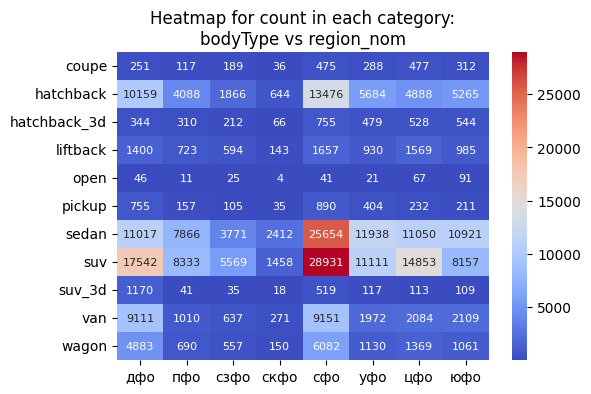

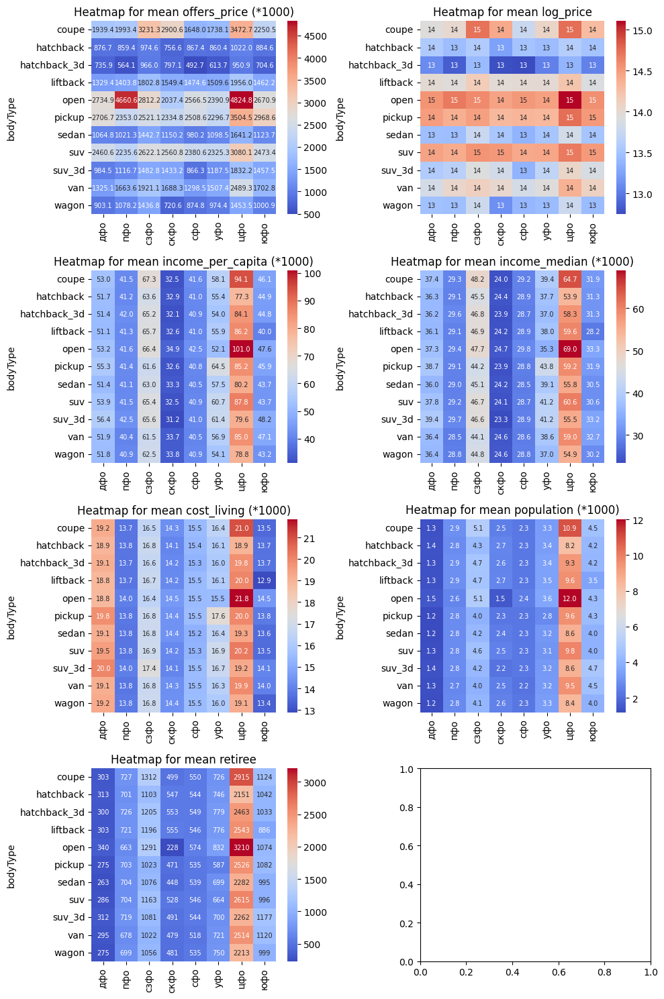

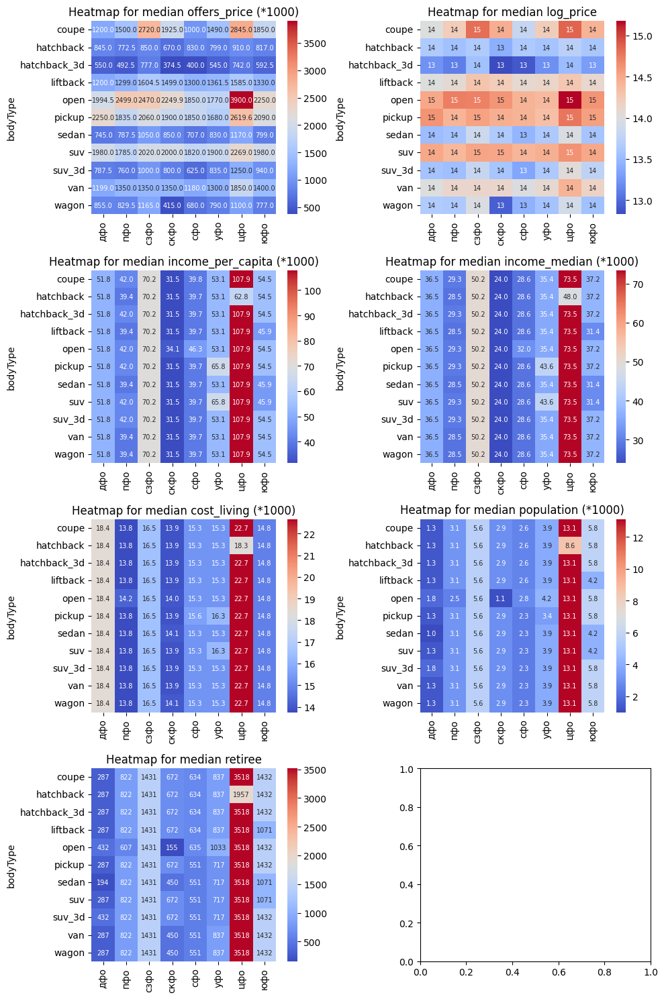

In [53]:
for func in metrics_:
    plot_pivots(
        data=df_old, target_lst=tars, rows="bodyType", cols="region_nom", agg_func=func
    )

--

## Correlation

### Preprocessing: Dealing with categorical and numerical columns

In [54]:
# create df to analyze correlation
scaled_df = df_old.copy()

scaled_df.drop(
    [
        "car_id",
        "country_code",
        "name",
        "region",
        "card_repair",
        "card_noDocs",
        "card_price_mark",
        "flag_new",
        "offers_price",
        "lat",
        "lon",
    ],
    axis=1,
    inplace=True,
)
scaled_df["productionDate"] = scaled_df["productionDate"].astype("object")

# Numerical columns include target variable
num_cols = scaled_df.select_dtypes(exclude=["object", "category"]).columns
cat_cols = scaled_df.select_dtypes(include=["object", "category"]).columns

In [55]:
# def get_scaled_df(data, target, force_obj=[], cardinality=5):
#     """
#     This function scales and encodes the features in the dataframe X and adds
#     the target variable y to the resulting dataframe.

#     """
#     from sklearn.compose import ColumnTransformer
#     from category_encoders import TargetEncoder
#     from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder
#     from sklearn.pipeline import Pipeline

#     # data split
#     X = data.copy()
#     # X = data.drop([target], axis=1)
#     # y = data[target]

#     # make cols object type, if numeric
#     X[force_obj] = X[force_obj].astype('object')

#     # categorize columns
#     num_cols = X.select_dtypes(exclude=['category', 'object']).columns
#     cat_cols = X.select_dtypes(include=['category', 'object']).columns
#     cols_low_card = [col for col in cat_cols if X[col].nunique() < cardinality]
#     cols_high_card = [col for col in cat_cols if X[col].nunique() >= cardinality]
#     print('Number of cols with low cardinality', len(cols_low_card), '/', len(cat_cols))

#     # get idx for cols
#     cat_low_card_idx = [list(X.columns).index(col) for col in cols_low_card]
#     cat_high_card_idx = [list(X.columns).index(col) for col in cols_high_card]
#     num_cols_idx = [list(X.columns).index(col) for col in num_cols]

#     # transformer with LabelEncoder
#     transformer = ColumnTransformer(transformers=[(
#         'OneHotEncoder', OneHotEncoder(drop='first'), cat_low_card_idx
#     ), ('LabelEncoder', OrdinalEncoder(),
#         cat_high_card_idx), ('StandardScaler', StandardScaler(),
#                              num_cols_idx)])

#     transformer.fit(X)
#     X_transformed = transformer.transform(X)
#     scaled_X = pd.DataFrame(X_transformed,
#                             columns=transformer.get_feature_names_out())

#     return scaled_X


# get_scaled_df(
#     data=scaled_df,
#     target='log_price',
#     force_obj=['productionDate'],
#     cardinality=15,
# ).shape

In [56]:
# Categorical cols
# For columns with more than 15 unique variables, we apply Mean Target Encoding method
# For the rest columns use simple OneHotEncoder

# cols_to_dum = []
# for col in cat_cols:
#     if scaled_df[col].nunique() <= 15:
#         cols_to_dum.append(col)
#     else:
#         mean_target = scaled_df.groupby(col)['log_price'].mean()
#         scaled_df[f'mdum_{col}'] = scaled_df[col].map(mean_target)
#         scaled_df = scaled_df.drop(col, axis=1)

# scaled_df = pd.get_dummies(scaled_df, columns=cols_to_dum, prefix='dum', drop_first=True)


# Preprocessing: Label encoding for categorical variables
le = LabelEncoder()
for col in cat_cols:
    scaled_df[col] = le.fit_transform(scaled_df[col])

In [57]:
# Numeric columns
scaler = StandardScaler()
scaled_numerical = scaler.fit_transform(scaled_df[num_cols])

# Convert the scaled numerical columns
scaled_df = scaled_df.drop(num_cols, axis=1)
scaled_numerical_df = pd.DataFrame(scaled_numerical, columns=num_cols)

In [58]:
scaled_df = pd.concat([scaled_numerical_df, scaled_df], axis=1)
print(scaled_df.shape)
scaled_df[:5]

(287521, 21)


,vehicleEngine_engineDisplacement,vehicleEngine_enginePower,card_distance_km,log_price,income_per_capita,income_median,cost_living,population,retiree,retiree_perc,bodyType,color,fuelType,productionDate,vehicleTransmission,brand,model,card_driveType,addresstype,state,region_nom
0,-1.06,-1.23,-1.17,0.19,-0.62,-0.56,-0.43,-0.74,-0.69,-0.06,4,13,2,33,3,18,246,1,3,73,4
1,-1.06,-1.23,-0.04,-0.17,-0.28,-0.32,-0.38,-0.19,-0.20,0.15,4,7,2,23,0,18,246,1,3,42,4
2,-1.06,-1.23,-0.26,0.45,-0.96,-0.85,-0.48,-0.47,-0.40,0.61,4,2,2,35,3,18,246,1,24,54,7
3,-1.06,-1.23,-1.56,0.23,-0.01,0.01,0.56,-0.50,-0.47,0.10,4,8,2,35,3,18,246,1,3,48,0
4,-1.06,-1.23,-0.79,0.11,0.12,0.06,-0.53,0.75,0.68,0.30,4,2,2,30,3,18,246,1,3,27,7


### Correlation matrix

In [59]:
# Highly correlated columns


def get_redundant_pairs(df):
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i + 1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop


def get_top_abs_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]


print("Top Absolute Correlations")
print(get_top_abs_correlations(scaled_df, 20))

Top Absolute Correlations
population                        retiree                     1.00
income_per_capita                 income_median               0.99
income_median                     cost_living                 0.80
                                  population                  0.79
income_per_capita                 cost_living                 0.78
income_median                     retiree                     0.78
income_per_capita                 population                  0.78
                                  retiree                     0.78
log_price                         productionDate              0.73
card_distance_km                  productionDate              0.60
vehicleEngine_enginePower         log_price                   0.58
vehicleEngine_engineDisplacement  vehicleEngine_enginePower   0.55
population                        region_nom                  0.46
retiree                           addresstype                 0.45
                                  re

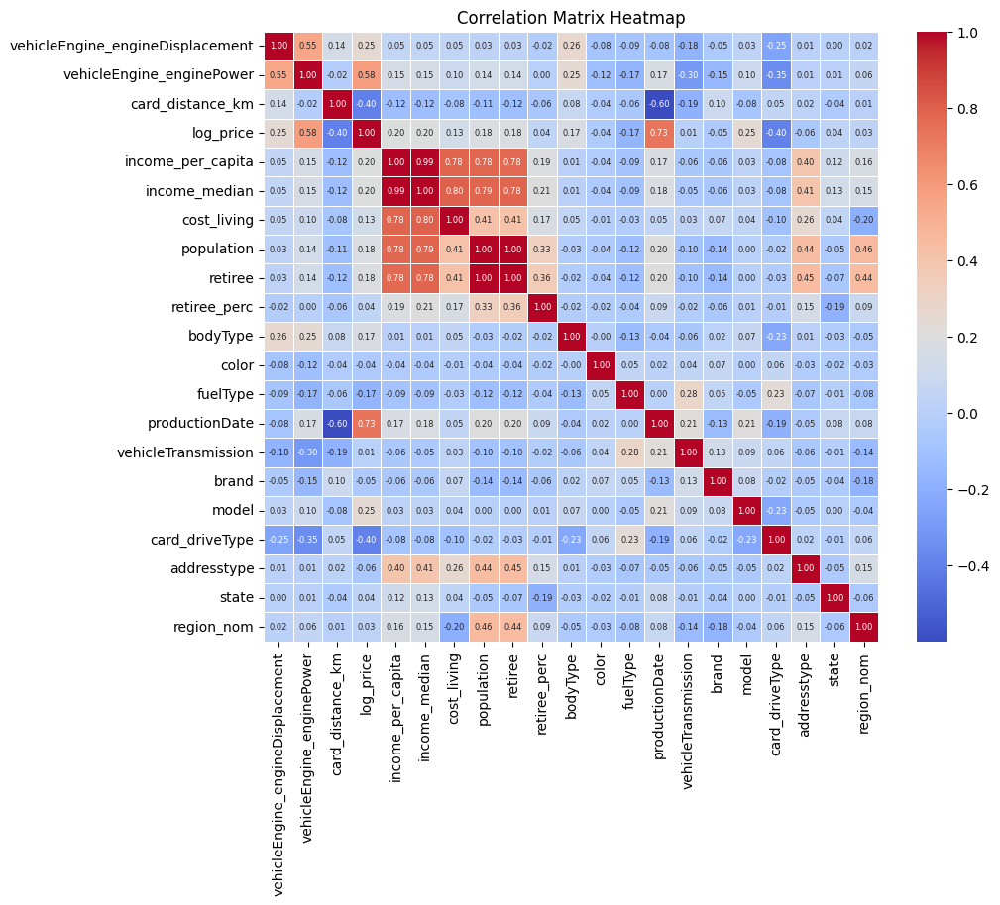

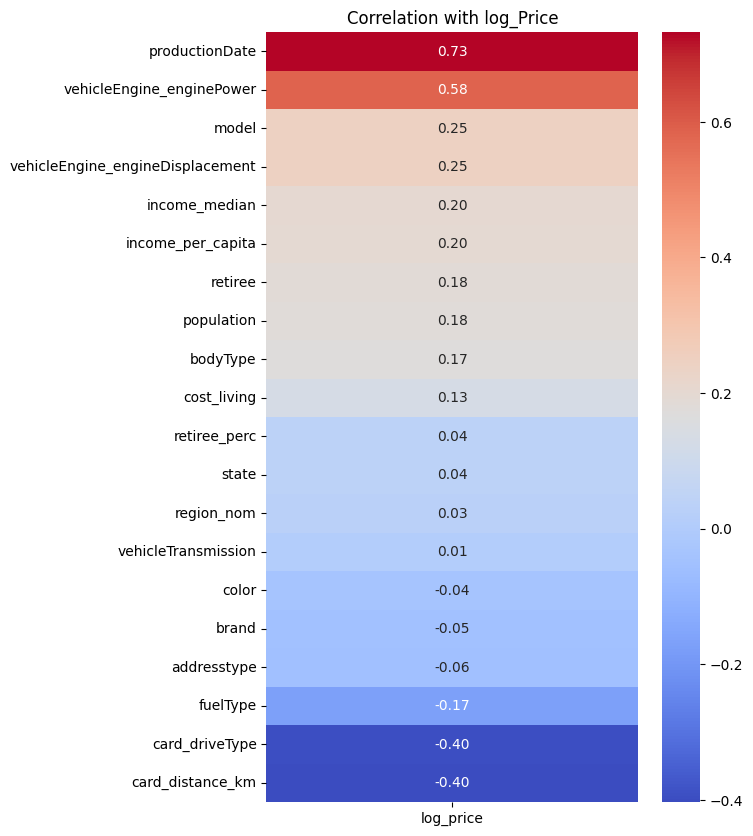

In [60]:
correlation_matrix = scaled_df.corr()

# Graph 1
plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap="coolwarm",
    linewidths=0.5,
    fmt=".2f",
    annot_kws={"size": 6},
)
plt.title("Correlation Matrix Heatmap")
plt.show()

# Graph 2
corr = scaled_df.corr()
target_corr = corr["log_price"].drop("log_price")

# Sort correlation values in descending order
target_corr_sorted = target_corr.sort_values(ascending=False)

# Create a heatmap of the correlations with the target column
plt.figure(figsize=(6, 10))
sns.heatmap(target_corr_sorted.to_frame(), cmap="coolwarm", annot=True, fmt=".2f")
plt.title("Correlation with log_Price")
plt.show()

### Save processed dataframe

In [61]:
processed_df = df_old.copy()

# create new column on base of highly correlated
processed_df["engine"] = (
    processed_df["vehicleEngine_enginePower"]
    * processed_df["vehicleEngine_engineDisplacement"]
)

# only include medium cardinality columns and exclude all that contain unnecessary information
processed_df = processed_df[
    [
        "bodyType",
        "brand",
        "model",
        "color",
        "productionDate",
        "card_distance_km",
        "fuelType",
        "engine",
        "vehicleTransmission",
        "card_driveType",
        "state",
        "region_nom",
        "income_median",
        "population",
        "offers_price",
    ]
].reset_index(drop=True)

# price in thousands and year as category
processed_df["offers_price"] = processed_df["offers_price"] / 1000
processed_df["productionDate"] = processed_df["productionDate"].astype("object")

processed_df = processed_df.rename(
    {
        "bodyType": "body",
        "vehicleTransmission": "transmission",
        "productionDate": "prodYear",
        "fuelType": "fuel",
        "card_driveType": "drive",
        "state": "region",
        "region_nom": "fedDistr",
        "card_distance_km": "mileage",
        "offers_price": "price",
    },
    axis=1,
)

print(processed_df.shape)
processed_df[:4]

(287521, 15)


,body,brand,model,color,prodYear,mileage,fuel,engine,transmission,drive,region,fedDistr,income_median,population,price
0,open,daihatsu,copen,silver,2017,49000,gasoline,44.80,variator,front,томская область,сфо,28578.50,1052.10,1300.00
1,open,daihatsu,copen,grey,2007,154578,gasoline,44.80,automatic,front,новосибирская область,сфо,31971.10,2794.30,925.00
2,open,daihatsu,copen,blue,2019,134000,gasoline,44.80,variator,front,республика крым,юфо,24681.10,1916.80,1650.00
3,open,daihatsu,copen,no_color,2019,12000,gasoline,44.80,variator,front,приморский край,дфо,36456.60,1820.10,1350.00


In [62]:
# check correlation again
processed_df_s = processed_df.copy()
cat_feat = processed_df_s.select_dtypes(
    include=["object", "category"]
).columns.to_list()
num_feat = processed_df_s.select_dtypes(
    exclude=["object", "category"]
).columns.to_list()

scaler = LabelEncoder()
for feat in cat_feat:
    processed_df_s[feat] = scaler.fit_transform(processed_df_s[feat])

scaler = StandardScaler()
for feat in num_feat:
    processed_df_s[feat] = scaler.fit_transform(
        processed_df_s[feat].values.reshape(-1, 1)
    )

In [63]:
# Highly correlated columns
print("Top Absolute Correlations")
print(get_top_abs_correlations(processed_df_s, 5))

Top Absolute Correlations
income_median  population   0.79
prodYear       mileage      0.60
               price        0.53
fedDistr       population   0.46
engine         price        0.43
dtype: float64


<b><span style='color:#16C2D5'>|</span> Conclusion: </b>
<br>

* **`prodYear`** vs **`price`**: feature is more correlated that others, however, it is obvious that cars depreciate over time highly.

* **`income_median`** vs **`population`**: gos_metrics are highy correlated by itself. Left once that 

<br>
<div style="border-radius:10px;border:#16C2D5 solid;padding: 15px;background-color:#ffffff00;font-size:100%;text-align:left">
    💬 Data frame is ready for predictive analysis. Highly correlated only gos_metrics, but not above peak. There are two columns that has low cardinality: fuel and transmission.

</div>

In [64]:
# from datetime import datetime

# curr_date = datetime.now().strftime("%Y-%m-%d")
# processed_df.to_csv(f'autodrom_processed_df.csv', sep=';', index=False)